# # Step 1 : Reading and Understanding the Data

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
# import all libraries and dependencies for dataframe
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
warnings.filterwarnings("ignore")
from datetime import datetime

# import all libraries and dependencies for data visualization
pd.options.display.float_format='{:.4f}'.format
plt.rcParams['figure.figsize'] = [8,8]
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', -1)
sns.set(style='darkgrid')
import matplotlib.ticker as ticker
import matplotlib.ticker as plticker

# import all libraries and dependencies for machine learning
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.base import TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score
import copy

In [ ]:
Data = pd.read_excel(r'/content/gdrive/My Drive/innercity.xlsx')

In [ ]:
house_df = display(pd.DataFrame(Data))

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0000,1.7500,3050.0000,9440.0000,1,0,0.0000,3,8.0000,1800.0000,1250.0000,1966,0,98034,47.7228,-122.1830,2020.0000,8660.0000,0.0000,12490
1,3145600250,20150317T000000,190000,2.0000,1.0000,670.0000,3101.0000,1,0,0.0000,4,6.0000,670.0000,0.0000,1948,0,98118,47.5546,-122.2740,1660.0000,4100.0000,0.0000,3771
2,7129303070,20140820T000000,735000,4.0000,2.7500,3040.0000,2415.0000,2,1,4.0000,3,8.0000,3040.0000,0.0000,1966,0,98118,47.5188,-122.2560,2620.0000,2433.0000,0.0000,5455
3,7338220280,20141010T000000,257000,3.0000,2.5000,1740.0000,3721.0000,2,0,0.0000,3,8.0000,1740.0000,0.0000,2009,0,98002,47.3363,-122.2130,2030.0000,3794.0000,0.0000,5461
4,7950300670,20150218T000000,450000,2.0000,1.0000,1120.0000,4590.0000,1,0,0.0000,3,7.0000,1120.0000,0.0000,1924,0,98118,47.5663,-122.2850,1120.0000,5100.0000,0.0000,5710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,203600600,20150310T000000,685530,4.0000,2.5000,3130.0000,60467.0000,2,0,0.0000,3,9.0000,3130.0000,0.0000,1996,0,98014,47.6618,-121.9620,2780.0000,44224.0000,1.0000,63597
21609,625049281,20140521T000000,535000,2.0000,1.0000,1030.0000,4841.0000,1,0,0.0000,3,7.0000,920.0000,110.0000,1939,0,98103,47.6860,-122.3410,1530.0000,4944.0000,0.0000,5871
21610,424069018,20140905T000000,998000,3.0000,3.7500,3710.0000,34412.0000,2,0,0.0000,3,10.0000,2910.0000,800.0000,1978,0,98075,47.5888,-122.0400,2390.0000,34412.0000,1.0000,38122
21611,7258200055,20150206T000000,262000,4.0000,2.5000,1560.0000,7800.0000,2,0,0.0000,3,7.0000,1560.0000,0.0000,1997,0,98168,47.5140,-122.3160,1160.0000,7800.0000,0.0000,9360


In [ ]:
print(Data.head(5))

          cid         dayhours   price  room_bed  room_bath  living_measure  \
0  3876100940  20150427T000000  600000 4.0000    1.7500     3050.0000         
1  3145600250  20150317T000000  190000 2.0000    1.0000     670.0000          
2  7129303070  20140820T000000  735000 4.0000    2.7500     3040.0000         
3  7338220280  20141010T000000  257000 3.0000    2.5000     1740.0000         
4  7950300670  20150218T000000  450000 2.0000    1.0000     1120.0000         

   lot_measure ceil coast  sight condition  quality  ceil_measure  basement  \
0 9440.0000     1    0    0.0000  3        8.0000   1800.0000     1250.0000   
1 3101.0000     1    0    0.0000  4        6.0000   670.0000      0.0000      
2 2415.0000     2    1    4.0000  3        8.0000   3040.0000     0.0000      
3 3721.0000     2    0    0.0000  3        8.0000   1740.0000     0.0000      
4 4590.0000     1    0    0.0000  3        7.0000   1120.0000     0.0000      

  yr_built  yr_renovated  zipcode     lat      lon

# Shape of the data

In [ ]:
Data.shape

(21613, 23)

# **Information** **of the data**

In [ ]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

In [ ]:
obj = (Data.dtypes == 'object')
object_cols = list(obj[obj].index)
print("Categorical variables:",len(object_cols))

int_ = (Data.dtypes == 'int')
num_cols = list(int_[int_].index)
print("Integer variables:",len(num_cols))

fl = (Data.dtypes == 'float')
fl_cols = list(fl[fl].index)
print("Float variables:",len(fl_cols))

Categorical variables: 7
Integer variables: 4
Float variables: 12


# Step 2: Cleaning the Data
We need to do some basic cleansing activity in order to feed our model the correct data.

In [ ]:
# Calculating the Missing Values % contribution in DF

df_null = Data.isna().mean().round(4) * 100

df_null.sort_values(ascending=False).head()

living_measure15   0.7700
room_bed           0.5000
room_bath          0.5000
sight              0.2600
condition          0.2600
dtype: float64

In [ ]:
from geopy.distance import geodesic

# Convert 'long' to numeric (replace '$' with NaN)
Data['long'] = pd.to_numeric(Data['long'], errors='coerce')

# Reference point coordinates
reference_coords = (47.5, -122.0)

# Calculate distances and create a new feature
Data['distance_to_reference'] = [geodesic(reference_coords, (lat, lon)).kilometers if pd.notna(lon) else None for lat, lon in zip(Data['lat'], Data['long'])]

# Create a DataFrame with the new feature
Data = pd.DataFrame(Data)

# Display the result
print(Data)

              cid         dayhours    price  room_bed  room_bath  \
0      3876100940  20150427T000000  600000  4.0000    1.7500       
1      3145600250  20150317T000000  190000  2.0000    1.0000       
2      7129303070  20140820T000000  735000  4.0000    2.7500       
3      7338220280  20141010T000000  257000  3.0000    2.5000       
4      7950300670  20150218T000000  450000  2.0000    1.0000       
...           ...              ...     ...     ...       ...       
21608  203600600   20150310T000000  685530  4.0000    2.5000       
21609  625049281   20140521T000000  535000  2.0000    1.0000       
21610  424069018   20140905T000000  998000  3.0000    3.7500       
21611  7258200055  20150206T000000  262000  4.0000    2.5000       
21612  8805900430  20141229T000000  1150000 4.0000    2.5000       

       living_measure  lot_measure ceil coast  sight condition  quality  \
0     3050.0000       9440.0000     1    0    0.0000  3        8.0000     
1     670.0000        3101.0000  

In [ ]:
# let's check whether our dataset have any null/missing values
Data.isnull().sum().sum()

757

*We have 757 null values.

# **Filling Null Values**

In [ ]:
Data1 =Data.fillna(value=0)

In [ ]:
Data1.isnull().sum().sum()

0

Now ,we have filled null values with 0 and we have 0 null values

In [ ]:
# let's check whether there's any duplicate record in our dataset or not. If present, we have to remove them
Data.duplicated().sum()

0

We don't have any duplicate record in out dataset. So we can say we have more than 21k Unique records*

In [ ]:
# dropping lat and long as we taken distance based on business knowledge

Data = Data.drop('long',axis=1)
Data = Data.drop('lat',axis=1)

In [ ]:
Data.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'living_measure15', 'lot_measure15', 'furnished', 'total_area',
       'distance_to_reference'],
      dtype='object')

In [ ]:
# Calculating the Missing Values % contribution in DF

df_null = Data.isna().mean().round(4) * 100

df_null.sort_values(ascending=False).head(10)

living_measure15        0.7700
room_bed                0.5000
room_bath               0.5000
sight                   0.2600
condition               0.2600
lot_measure             0.1900
ceil                    0.1900
distance_to_reference   0.1600
total_area              0.1300
furnished               0.1300
dtype: float64

In [ ]:
# let's check whether our dataset have any null/missing values
Data.isnull().sum().sum()

723

In [ ]:
# Columns having non alpha-numeric character "$"
display((Data == "$").sum()[(Data == "$").sum()>0])
display((Data == "$").sum()[(Data == "$").sum()>0].sum())

ceil          30
coast         30
condition     28
yr_built      14
total_area    39
dtype: int64

141

In [ ]:
Data_new =Data.copy()

In [ ]:
Data_new =Data.fillna(0)
Data_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   cid                    21613 non-null  int64  
 1   dayhours               21613 non-null  object 
 2   price                  21613 non-null  int64  
 3   room_bed               21613 non-null  float64
 4   room_bath              21613 non-null  float64
 5   living_measure         21613 non-null  float64
 6   lot_measure            21613 non-null  float64
 7   ceil                   21613 non-null  object 
 8   coast                  21613 non-null  object 
 9   sight                  21613 non-null  float64
 10  condition              21613 non-null  object 
 11  quality                21613 non-null  float64
 12  ceil_measure           21613 non-null  float64
 13  basement               21613 non-null  float64
 14  yr_built               21613 non-null  object 
 15  yr

# **Replacing $ with zero**

In [ ]:
Data_new =Data.replace(['$'],'0')

In [ ]:
# CORRECTING THE DATATYPES
# ceil,coast,condition,total_area data type to be changed to float64

Data_new["ceil"] = Data_new["ceil"].astype("float64")
Data_new["coast"] = Data_new["coast"].astype("float64")
Data_new["condition"] = Data_new["condition"].astype("float64")
Data_new["total_area"] = Data_new["total_area"].astype("float64")

In [ ]:
Data_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   cid                    21613 non-null  int64  
 1   dayhours               21613 non-null  object 
 2   price                  21613 non-null  int64  
 3   room_bed               21505 non-null  float64
 4   room_bath              21505 non-null  float64
 5   living_measure         21596 non-null  float64
 6   lot_measure            21571 non-null  float64
 7   ceil                   21571 non-null  float64
 8   coast                  21612 non-null  float64
 9   sight                  21556 non-null  float64
 10  condition              21556 non-null  float64
 11  quality                21612 non-null  float64
 12  ceil_measure           21612 non-null  float64
 13  basement               21612 non-null  float64
 14  yr_built               21612 non-null  object 
 15  yr

In [ ]:
#Df before before replacing $ with 0
print(Data.head(10))

          cid         dayhours    price  room_bed  room_bath  living_measure  \
0  3876100940  20150427T000000  600000  4.0000    1.7500     3050.0000         
1  3145600250  20150317T000000  190000  2.0000    1.0000     670.0000          
2  7129303070  20140820T000000  735000  4.0000    2.7500     3040.0000         
3  7338220280  20141010T000000  257000  3.0000    2.5000     1740.0000         
4  7950300670  20150218T000000  450000  2.0000    1.0000     1120.0000         
5  8016250080  20140709T000000  245000  3.0000    2.5000     1610.0000         
6  510002519   20140715T000000  466000  2.0000    1.5000     1140.0000         
7  1624059224  20140618T000000  1160000 4.0000    3.5000     4680.0000         
8  5469503280  20140721T000000  449950  4.0000    2.5000     3100.0000         
9  2787460430  20141028T000000  299950  2.0000    1.7500     1460.0000         

   lot_measure ceil coast  sight condition  quality  ceil_measure  basement  \
0 9440.0000     1    0    0.0000  3     

In [ ]:
#Data after replacing with $ with 0
print(Data_new.head(10))

          cid         dayhours    price  room_bed  room_bath  living_measure  \
0  3876100940  20150427T000000  600000  4.0000    1.7500     3050.0000         
1  3145600250  20150317T000000  190000  2.0000    1.0000     670.0000          
2  7129303070  20140820T000000  735000  4.0000    2.7500     3040.0000         
3  7338220280  20141010T000000  257000  3.0000    2.5000     1740.0000         
4  7950300670  20150218T000000  450000  2.0000    1.0000     1120.0000         
5  8016250080  20140709T000000  245000  3.0000    2.5000     1610.0000         
6  510002519   20140715T000000  466000  2.0000    1.5000     1140.0000         
7  1624059224  20140618T000000  1160000 4.0000    3.5000     4680.0000         
8  5469503280  20140721T000000  449950  4.0000    2.5000     3100.0000         
9  2787460430  20141028T000000  299950  2.0000    1.7500     1460.0000         

   lot_measure   ceil  coast  sight  condition  quality  ceil_measure  \
0 9440.0000    1.0000 0.0000 0.0000 3.0000    

# **EDA :Exploratory Data Analysis**

# **New Datatypes :**

In [ ]:
# Datatypes
Data_new.dtypes

cid                      int64  
dayhours                 object 
price                    int64  
room_bed                 float64
room_bath                float64
living_measure           float64
lot_measure              float64
ceil                     float64
coast                    float64
sight                    float64
condition                float64
quality                  float64
ceil_measure             float64
basement                 float64
yr_built                 object 
yr_renovated             int64  
zipcode                  int64  
living_measure15         float64
lot_measure15            float64
furnished                float64
total_area               float64
distance_to_reference    float64
dtype: object

(21613, 22)

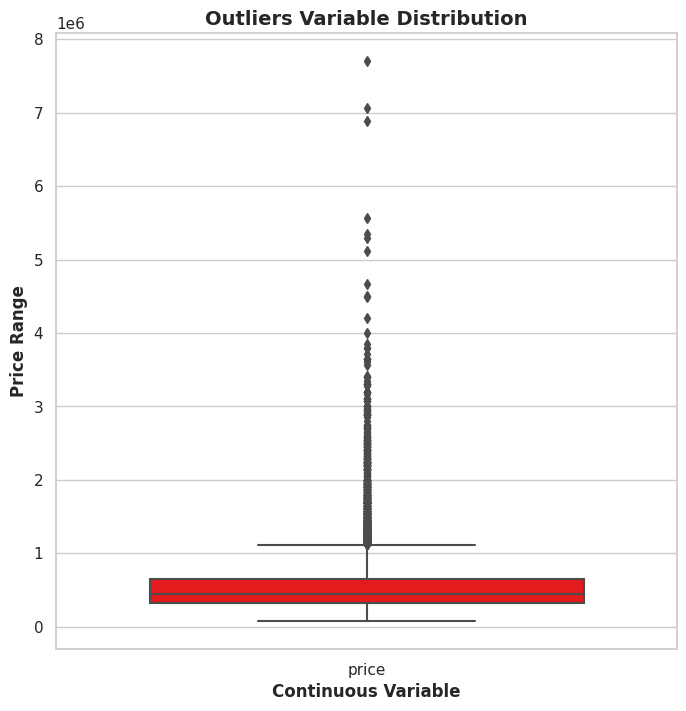

In [ ]:
# Outlier Analysis of target variable with maximum amount of Inconsistency

outliers = ['price']
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.boxplot(data=Data_new[outliers], orient="v", palette="Set1" ,whis=1.5,saturation=1, width=0.7)
plt.title("Outliers Variable Distribution", fontsize = 14, fontweight = 'bold')
plt.ylabel("Price Range", fontweight = 'bold')
plt.xlabel("Continuous Variable", fontweight = 'bold')
Data_new.shape

In [ ]:
display(Data_new.yr_renovated.value_counts())

0       20699
2014    91   
2013    37   
2003    36   
2007    35   
        ..   
1944    1    
1948    1    
1959    1    
1951    1    
1954    1    
Name: yr_renovated, Length: 70, dtype: int64

We can see most renovation took place in year 2014.

In [ ]:
# let's do the 5 - factor analysis of the features

Data_new.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0000,4580301520.8650,2876565571.3121,1000102.0000,2123049194.0000,3904930410.0000,7308900445.0000,9900000190.0000
price,21613.0000,540182.1588,367362.2317,75000.0000,321950.0000,450000.0000,645000.0000,7700000.0000
room_bed,21505.0000,3.3714,0.9303,0.0000,3.0000,3.0000,4.0000,33.0000
room_bath,21505.0000,2.1152,0.7702,0.0000,1.7500,2.2500,2.5000,8.0000
living_measure,21596.0000,2079.8608,918.4961,290.0000,1429.2500,1910.0000,2550.0000,13540.0000
lot_measure,21571.0000,15104.5833,41423.6194,520.0000,5040.0000,7618.0000,10684.5000,1651359.0000
ceil,21571.0000,1.4920,0.5424,0.0000,1.0000,1.5000,2.0000,3.5000
coast,21612.0000,0.0074,0.0860,0.0000,0.0000,0.0000,0.0000,1.0000
sight,21556.0000,0.2344,0.7664,0.0000,0.0000,0.0000,0.0000,4.0000
condition,21556.0000,3.4049,0.6618,0.0000,3.0000,3.0000,4.0000,5.0000


From above analysis we got to know,

Most columns distribution is Right-Skewed and only few features are Left-Skewed (like room_bath, yr_built, lat).

We have columns which are Categorical in nature are -> coast, yr_renovated, furnished

In [ ]:
Data_new.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'living_measure15', 'lot_measure15', 'furnished', 'total_area',
       'distance_to_reference'],
      dtype='object')

# **Univariate Analysis**

# **Analyzing Feature: cid**

In [ ]:
#cid - CID is appearing muliple times, it seems data contains house which is sold multiple times
cid_count=Data_new.cid.value_counts()
cid_count[cid_count>1].shape

(176,)

# **Analyzing Feature: dayhours**

In [ ]:
house_dfr=Data_new.copy()
Data_new.dayhours=Data_new.dayhours.str.replace('T000000', "")
Data_new.dayhours=pd.to_datetime(Data_new.dayhours,format='%Y%m%d')
Data_new['month_year']=Data_new['dayhours'].apply(lambda x: x.strftime('%B-%Y'))
Data_new['month_year'].head()

AttributeError: ignored

In [ ]:
# Converting dayhours to datetime
Data_new ['dayhours'] = pd.to_datetime(Data_new['dayhours'])
Data_new.head(2)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,month_year
0,3876100940,2015-04-27,600000,4.0000,1.7500,3050.0000,9440.0000,1.0000,0.0000,0.0000,3.0000,8.0000,1800.0000,1250.0000,1966,0,98034,2020.0000,8660.0000,0.0000,12490.0000,28.3360,April-2015
1,3145600250,2015-03-17,190000,2.0000,1.0000,670.0000,3101.0000,1.0000,0.0000,0.0000,4.0000,6.0000,670.0000,0.0000,1948,0,98118,1660.0000,4100.0000,0.0000,3771.0000,21.5079,March-2015


In [ ]:
Data_new['year'] = Data_new['dayhours'].dt.year
Data_new['month'] = Data_new['dayhours'].dt.month
Data_new['day'] = Data_new['dayhours'].dt.day

In [ ]:
Data_new['month_year'].value_counts()

April-2015        2231
July-2014         2211
June-2014         2180
August-2014       1940
October-2014      1878
March-2015        1875
September-2014    1774
May-2014          1768
December-2014     1471
November-2014     1411
February-2015     1250
January-2015      978 
May-2015          646 
Name: month_year, dtype: int64

We can see, most houses sold in April & July month

In [ ]:
Data_new.groupby(['month_year'])['price'].agg('mean')

month_year
April-2015       561933.4630
August-2014      536527.0397
December-2014    524602.8933
February-2015    507919.6032
January-2015     525963.2515
July-2014        544892.1610
June-2014        558123.7362
March-2015       544057.6832
May-2014         548166.6001
May-2015         558193.0960
November-2014    522058.8618
October-2014     539127.4776
September-2014   529315.8681
Name: price, dtype: float64

So the time line of the sale data of the properties is from May-2014 to May-2015 and April month have the highest mean price.

In [ ]:
#Now Dropping dayhours and month_year
Data_new.drop('dayhours', axis=1, inplace=True)
Data_new.drop('month_year', axis=1, inplace=True)

In [ ]:
Data_new.columns

Index(['cid', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'living_measure15', 'lot_measure15', 'furnished', 'total_area',
       'distance_to_reference', 'year', 'month', 'day'],
      dtype='object')

# **Analyzing Feature: Price (our Target)**

In [ ]:
Data_new.price.describe()

count   21613.0000  
mean    540182.1588 
std     367362.2317 
min     75000.0000  
25%     321950.0000 
50%     450000.0000 
75%     645000.0000 
max     7700000.0000
Name: price, dtype: float64

In [ ]:
# % observations with null values in the dataset
723/Data_new.shape[0]

0.03345208902049692

In [ ]:
#> ~3% observations have null values. Since this is less than 5%, we can drop the rows with nulls
Data_new=Data_new.dropna(axis=0)

In [ ]:
Data_new.isna().sum().sum()

0

#> No null values

In [ ]:
Data_new.shape
#> After null value treatment and removing undesired columns, we get 21387 rows and 23 columns

(21353, 24)

In [ ]:
Data_new.yr_renovated.value_counts()
#> Due to high number of zeros in the column, its of no value for further analysis. Hence we drop the yr_renovated column.

0       20456
2014    89   
2013    37   
2003    36   
2007    35   
        ..   
1948    1    
1959    1    
1951    1    
1944    1    
1954    1    
Name: yr_renovated, Length: 70, dtype: int64

In [ ]:
Data_new.columns

Index(['cid', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'living_measure15', 'lot_measure15', 'furnished', 'total_area',
       'distance_to_reference', 'year', 'month', 'day'],
      dtype='object')

In [ ]:
Data_new.head()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day
0,3876100940,600000,4.0000,1.7500,3050.0000,9440.0000,1.0000,0.0000,0.0000,3.0000,8.0000,1800.0000,1250.0000,1966,0,98034,2020.0000,8660.0000,0.0000,12490.0000,28.3360,2015,4,27
1,3145600250,190000,2.0000,1.0000,670.0000,3101.0000,1.0000,0.0000,0.0000,4.0000,6.0000,670.0000,0.0000,1948,0,98118,1660.0000,4100.0000,0.0000,3771.0000,21.5079,2015,3,17
2,7129303070,735000,4.0000,2.7500,3040.0000,2415.0000,2.0000,1.0000,4.0000,3.0000,8.0000,3040.0000,0.0000,1966,0,98118,2620.0000,2433.0000,0.0000,5455.0000,19.3974,2014,8,20
3,7338220280,257000,3.0000,2.5000,1740.0000,3721.0000,2.0000,0.0000,0.0000,3.0000,8.0000,1740.0000,0.0000,2009,0,98002,2030.0000,3794.0000,0.0000,5461.0000,24.2813,2014,10,10
4,7950300670,450000,2.0000,1.0000,1120.0000,4590.0000,1.0000,0.0000,0.0000,3.0000,7.0000,1120.0000,0.0000,1924,0,98118,1120.0000,5100.0000,0.0000,5710.0000,22.6901,2015,2,18


In [ ]:
# Converting yr_built  into int datatype
Data_new['yr_built']=Data_new['yr_built'].astype("int64")

In [ ]:
Data_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21353 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   cid                    21353 non-null  int64  
 1   price                  21353 non-null  int64  
 2   room_bed               21353 non-null  float64
 3   room_bath              21353 non-null  float64
 4   living_measure         21353 non-null  float64
 5   lot_measure            21353 non-null  float64
 6   ceil                   21353 non-null  float64
 7   coast                  21353 non-null  float64
 8   sight                  21353 non-null  float64
 9   condition              21353 non-null  float64
 10  quality                21353 non-null  float64
 11  ceil_measure           21353 non-null  float64
 12  basement               21353 non-null  float64
 13  yr_built               21353 non-null  int64  
 14  yr_renovated           21353 non-null  int64  
 15  zi

In [ ]:
# Dropping undesired columns - cid
Data_new.drop('cid',axis=1,inplace=True)

In [ ]:
Data_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21353 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   price                  21353 non-null  int64  
 1   room_bed               21353 non-null  float64
 2   room_bath              21353 non-null  float64
 3   living_measure         21353 non-null  float64
 4   lot_measure            21353 non-null  float64
 5   ceil                   21353 non-null  float64
 6   coast                  21353 non-null  float64
 7   sight                  21353 non-null  float64
 8   condition              21353 non-null  float64
 9   quality                21353 non-null  float64
 10  ceil_measure           21353 non-null  float64
 11  basement               21353 non-null  float64
 12  yr_built               21353 non-null  int64  
 13  yr_renovated           21353 non-null  int64  
 14  zipcode                21353 non-null  int64  
 15  li

In [ ]:
# Columns having non alpha-numeric character "$"
display((Data_new == "$").sum()[(Data_new == "$").sum()>0])
display((Data_new == "$").sum()[(Data_new == "$").sum()>0].sum())

Series([], dtype: int64)

0

# **Step 3: Visualising the Data**
Here we will identify if some predictors directly have a strong association

with the outcome variable price

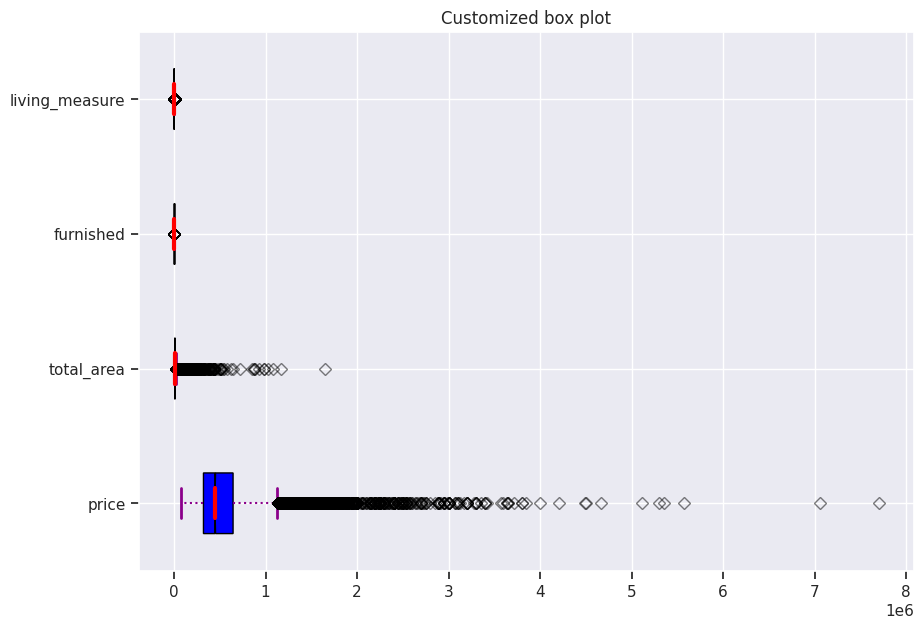

In [ ]:
#let's first import the required libraries for the plots
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Creating dataset
np.random.seed(10)
price = Data_new['price']
total_area= Data_new['total_area']
furnished= Data_new['furnished']
living_measure = Data_new['living_measure']
data = [price , total_area, furnished, living_measure ]

fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)

# Creating axes instance
bp = ax.boxplot(data, patch_artist = True,
                notch ='True', vert = 0)

colors = ['#0000FF', '#00FF00',
          '#FFFF00', '#FF00FF']

for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

# changing color and linewidth of
# whiskers
for whisker in bp['whiskers']:
    whisker.set(color ='#8B008B',
                linewidth = 1.5,
                linestyle =":")

# changing color and linewidth of
# caps
for cap in bp['caps']:
    cap.set(color ='#8B008B',
            linewidth = 2)

# changing color and linewidth of
# medians
for median in bp['medians']:
    median.set(color ='red',
               linewidth = 3)

# changing style of fliers
for flier in bp['fliers']:
    flier.set(marker ='D',
              color ='#e7298a',
              alpha = 0.5)

# x-axis labels
ax.set_yticklabels(['price', 'total_area',
                    'furnished', 'living_measure'])

# Adding title
plt.title("Customized box plot")

# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()

# show plot
plt.show()



Text(0, 0.5, 'price')

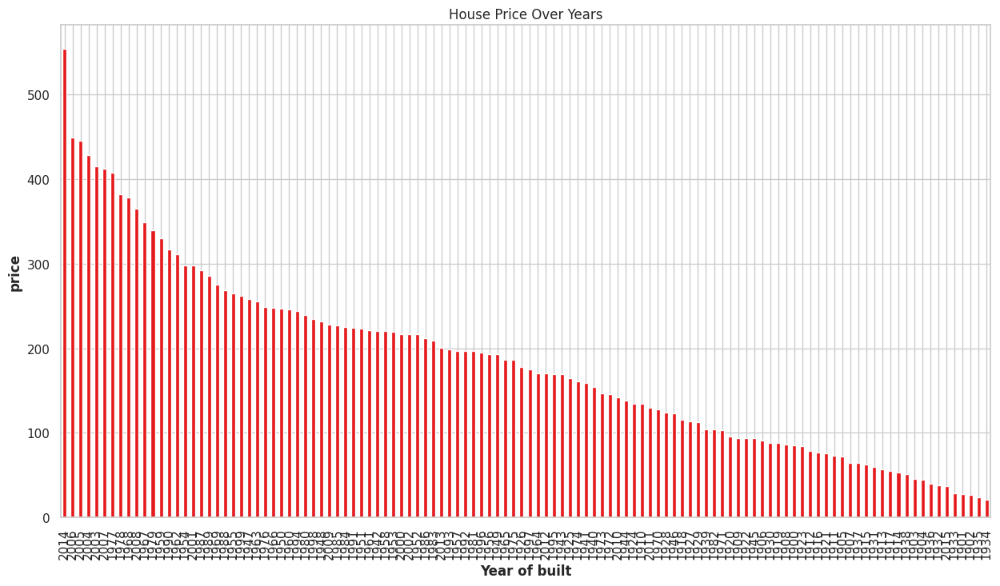

In [ ]:

plt.rcParams['figure.figsize'] = [15,8]
ax=Data_new['yr_built'].value_counts().plot(kind='bar',stacked=True, colormap = 'Set1')
ax.title.set_text('House Price Over Years')
plt.xlabel("Year of built",fontweight = 'bold')
plt.ylabel("price",fontweight = 'bold')

<Axes: xlabel='price', ylabel='Density'>

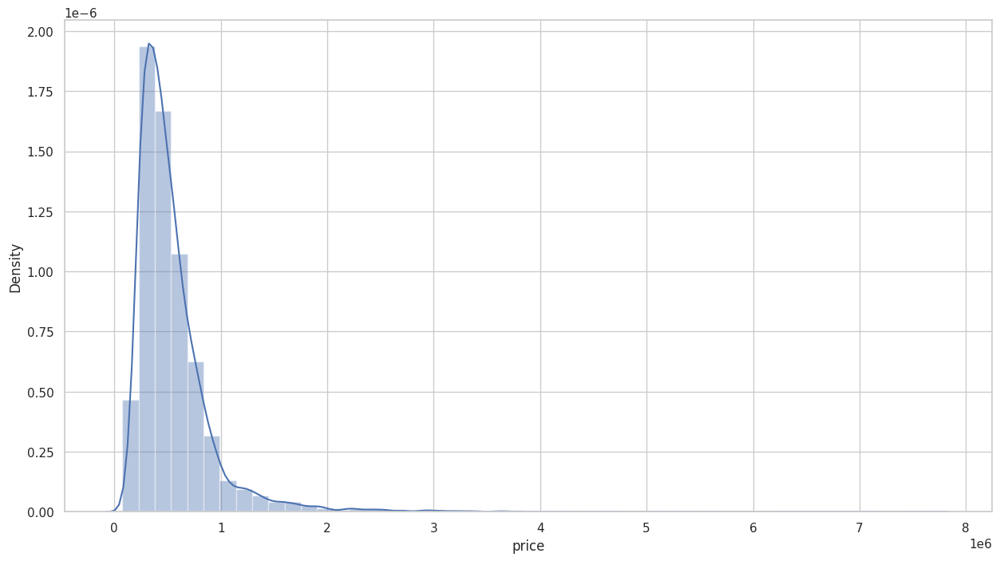

In [ ]:
sns.distplot(Data_new['price'])

<Axes: title={'center': 'House Price Distribution Plot'}, xlabel='price', ylabel='Density'>

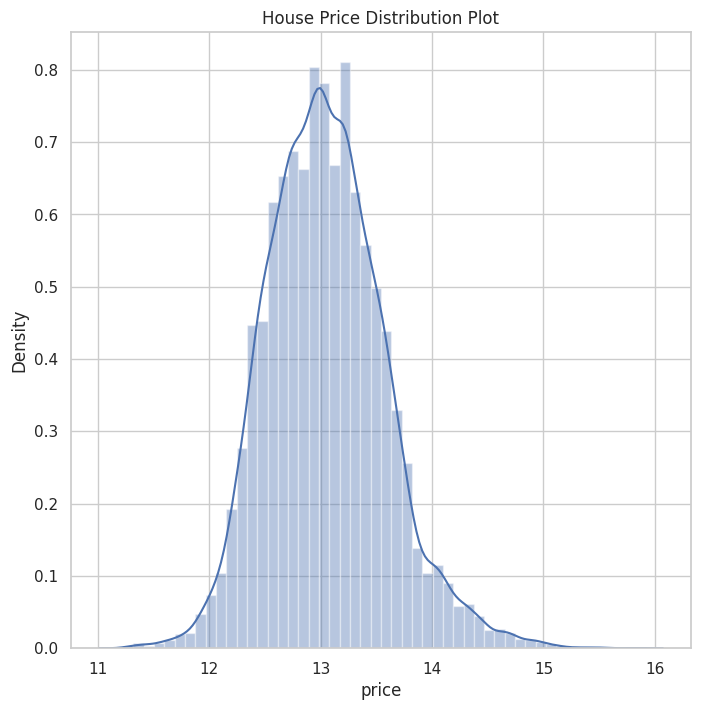

In [ ]:
plt.figure(figsize=(8,8))

plt.title('House Price Distribution Plot')
sns.distplot(np.log(Data_new['price']))

In [ ]:
#Number of bedrooms
Data_new['room_bed'].value_counts()

3.0000     9708
4.0000     6799
2.0000     2727
5.0000     1582
6.0000     266 
1.0000     197 
7.0000     38  
0.0000     13  
8.0000     12  
9.0000     6   
10.0000    3   
33.0000    1   
11.0000    1   
Name: room_bed, dtype: int64

# **Visualising Numeric Variables**

# Pairplot of all the numeric variables

In [ ]:
# Segregation of Numerical and Categorical Variables/Columns

cat_col = Data_new.select_dtypes(include=['object']).columns
num_col = Data_new.select_dtypes(exclude=['object']).columns
df_cat = Data_new[cat_col]
df_num = Data_new[num_col]

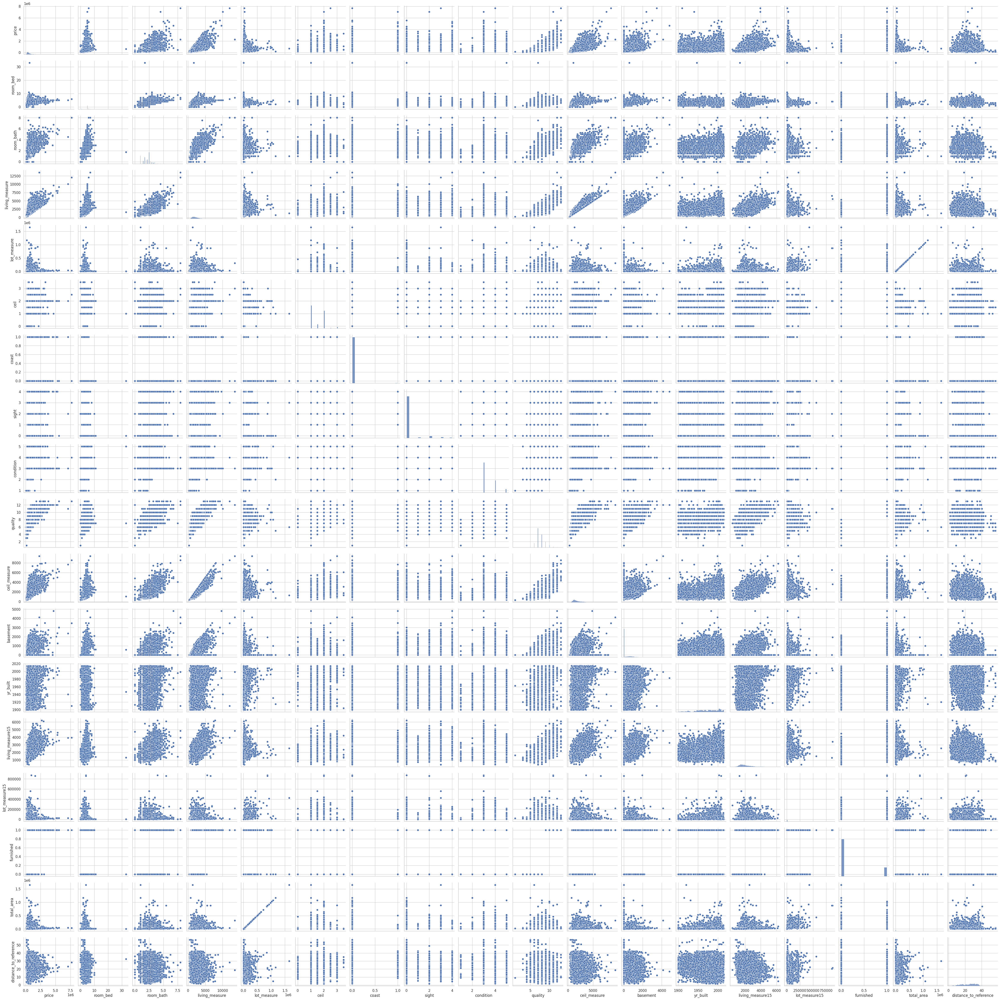

In [ ]:
ax = sns.pairplot(Data_new[num_col])

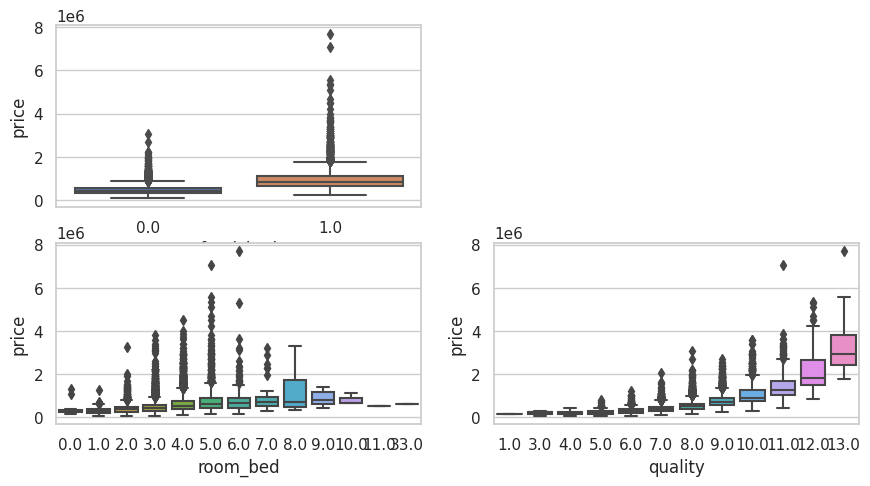

In [ ]:
plt.figure(figsize=(16, 8))
plt.subplot(3,3,5)
sns.boxplot(x = 'furnished', y = 'price', data = Data_new)
plt.subplot(3,3,8)
sns.boxplot(x = 'room_bed', y = 'price', data = Data_new)
plt.subplot(3,3,9)
sns.boxplot(x = 'quality', y = 'price', data = Data_new)
plt.show()

[Text(0.5, 1.0, 'No.Of Bedrooms')]

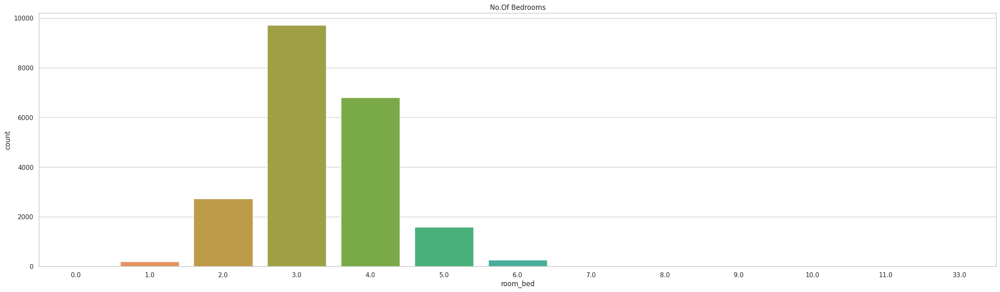

In [ ]:
plt.figure(figsize=(30,8))
sns.countplot(x=Data_new["room_bed"]).set(title='No.Of Bedrooms')

Majority has 3 bedrooms,followed by 4 bedrooms,then 2bedrooms.

# **Graphical Representation Of bathrooms:**

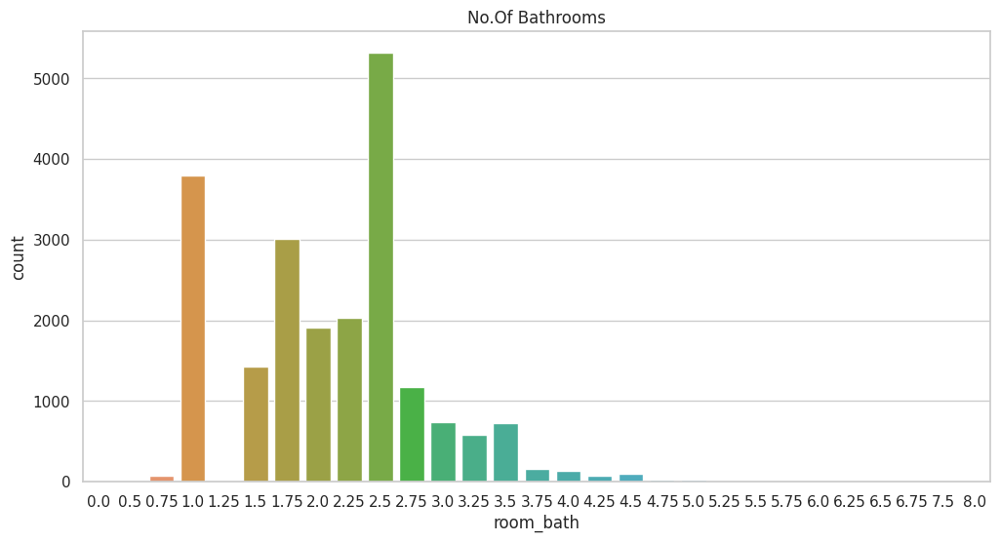

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x=Data_new.room_bath).set(title='No.Of Bathrooms');

2.5 bathrooms found in majority of houses follwed by 1 bathroom.

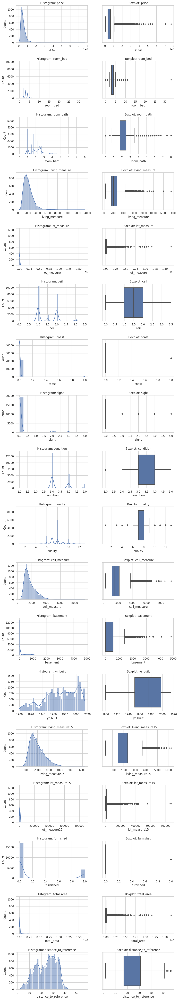

In [ ]:
fig,axes = plt.subplots(18,2,figsize=(12,75))
plt.subplots_adjust(hspace=.5)#wspace
for i,j in zip(num_col,axes):
    sns.histplot(x=i,kde=True,data = Data_new,ax=j[0])
    j[0].set_title('Histogram: '+i)
    sns.boxplot(x=i,data=Data_new,ax=j[1],orient='h')
    j[1].set_title('Boxplot: '+i)

Skewness is:  1.4533885705093375


count   21353.0000
mean    2080.1701 
std     917.5419  
min     290.0000  
25%     1430.0000 
50%     1910.0000 
75%     2550.0000 
max     13540.0000
Name: living_measure, dtype: float64

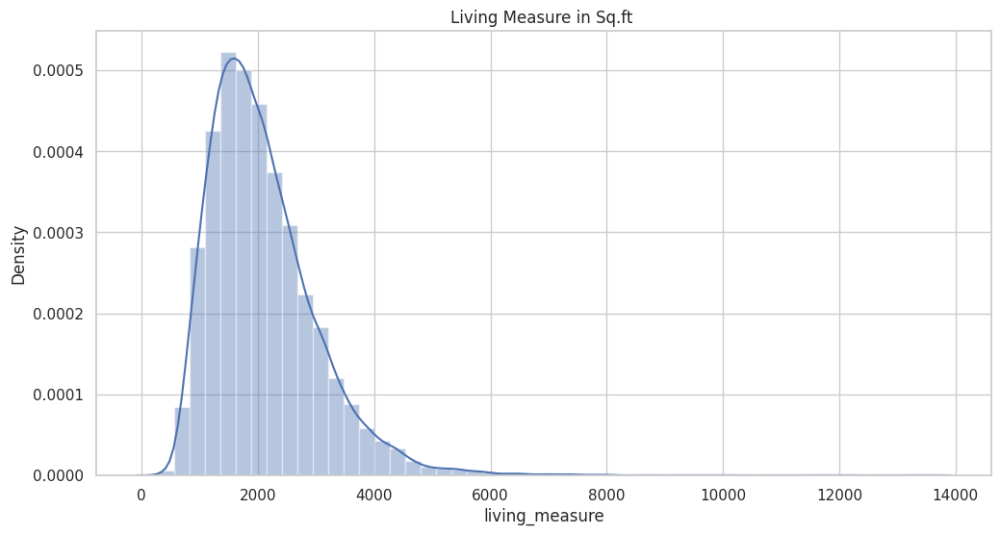

In [ ]:
#Living measure(Square footage of the home)
plt.figure(figsize=(12,6))
print("Skewness is: " ,Data_new.living_measure.skew())
sns.distplot(Data_new.living_measure).set(title='Living Measure in Sq.ft ');
Data_new.living_measure.describe()

From The above graph it is observed that majority of the house's living measure is 2000sq.ft

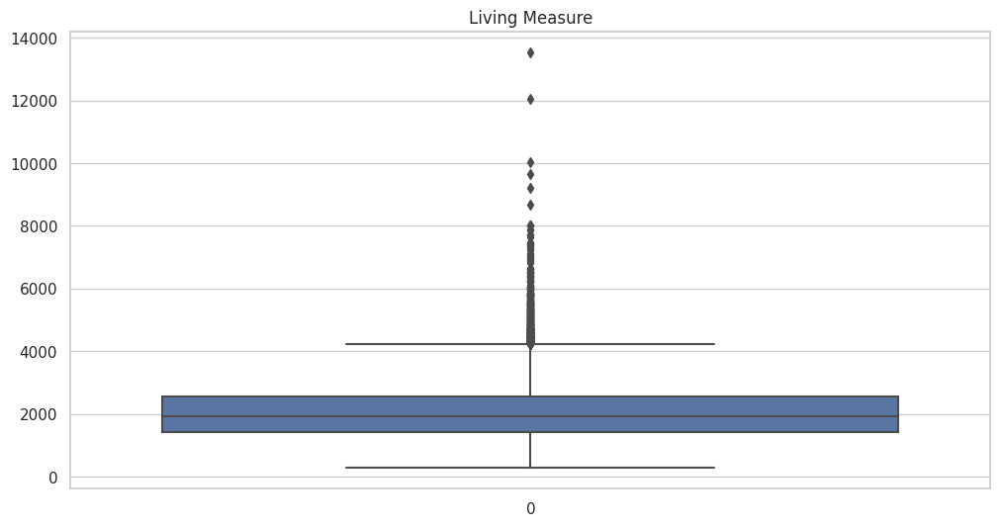

In [ ]:
#Boxpot for living_measure
plt.figure(figsize=(12,6))
sns.boxplot(Data_new.living_measure).set(title='Living Measure');

Many Outliers are observed here.

Skewness is:  13.094761567298482


count   21353.0000  
mean    15117.4548  
std     41480.0092  
min     520.0000    
25%     5040.0000   
50%     7620.0000   
75%     10685.0000  
max     1651359.0000
Name: lot_measure, dtype: float64

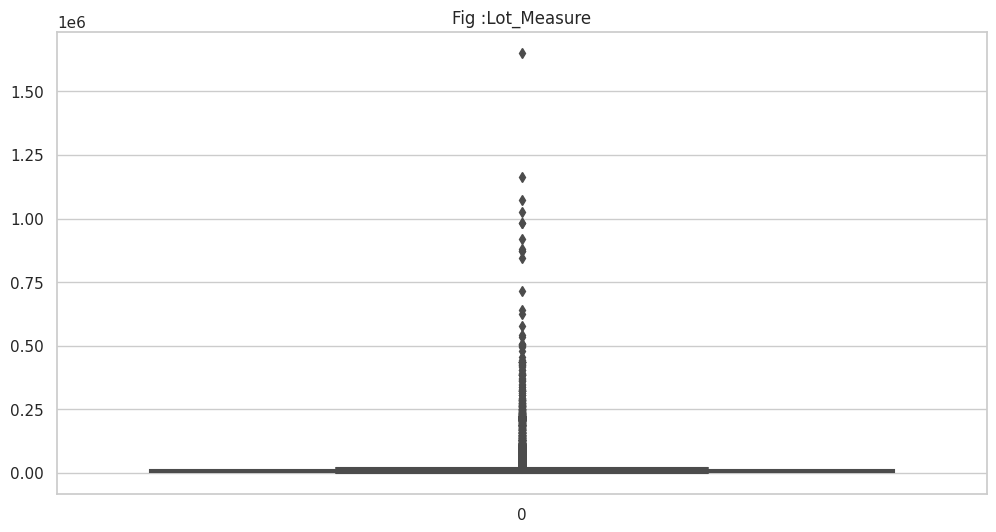

In [ ]:
#Lot_measure(Square footage of the lot)
plt.figure(figsize=(12,6))
print("Skewness is: " ,Data_new.lot_measure.skew())
sns.boxplot(Data_new.lot_measure).set(title='Fig :Lot_Measure');
Data_new.lot_measure.describe()

Distribution of lot_measure is highly skewed with outliers.

In [ ]:
#Ceil(Total floors in house)

Data_new.ceil.value_counts()

1.0000    10526
2.0000    8132 
1.5000    1888 
3.0000    609  
2.5000    160  
0.0000    30   
3.5000    8    
Name: ceil, dtype: int64

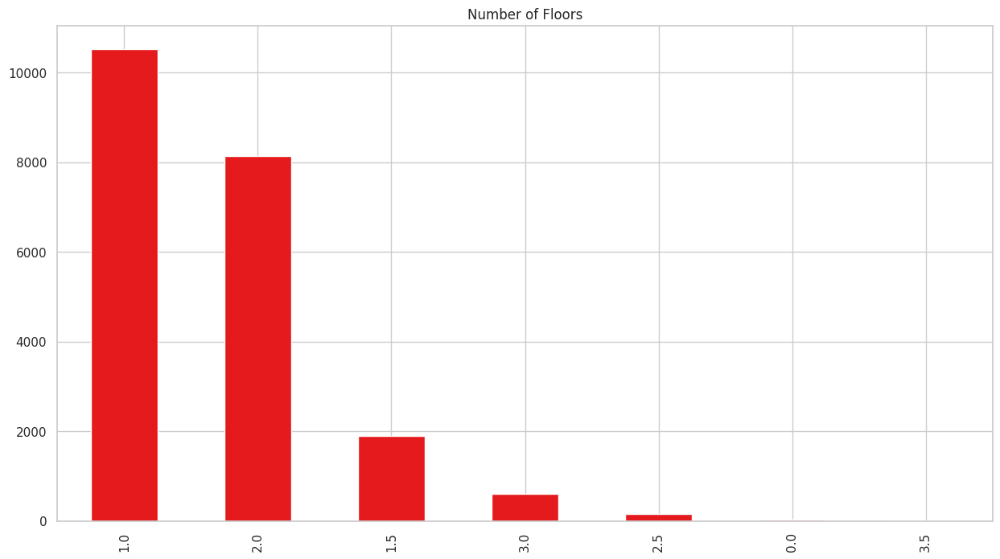

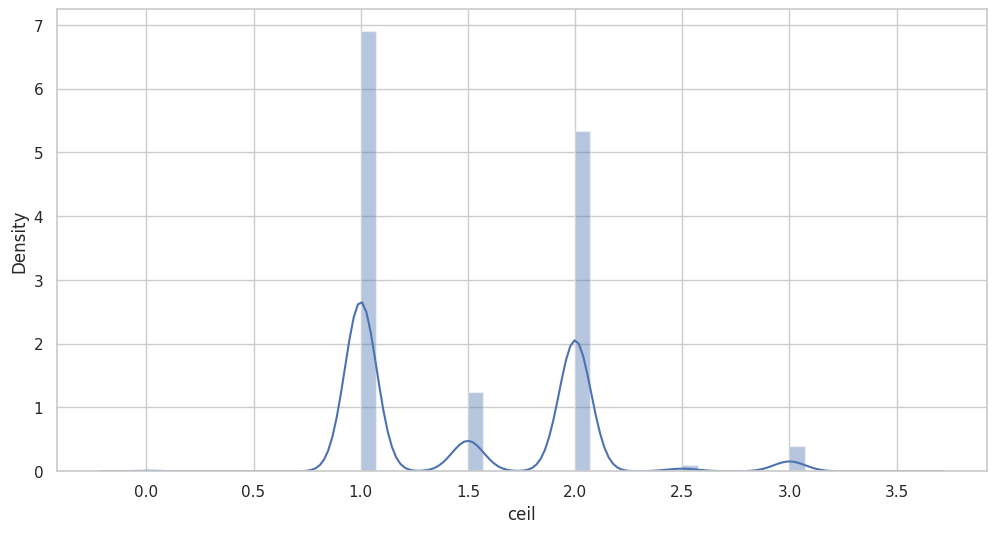

In [ ]:
ax=Data_new['ceil'].value_counts().plot(kind='bar',stacked=True, colormap = 'Set1')
ax.title.set_text('Number of Floors')
plt.figure(figsize=(12,6))
sns.distplot(Data_new.ceil);

Most of the houses has 1 floor followed by 2.

count   21387.0000
mean    2080.4733 
std     918.9430  
min     290.0000  
25%     1430.0000 
50%     1910.0000 
75%     2550.0000 
max     13540.0000
Name: living_measure, dtype: float64

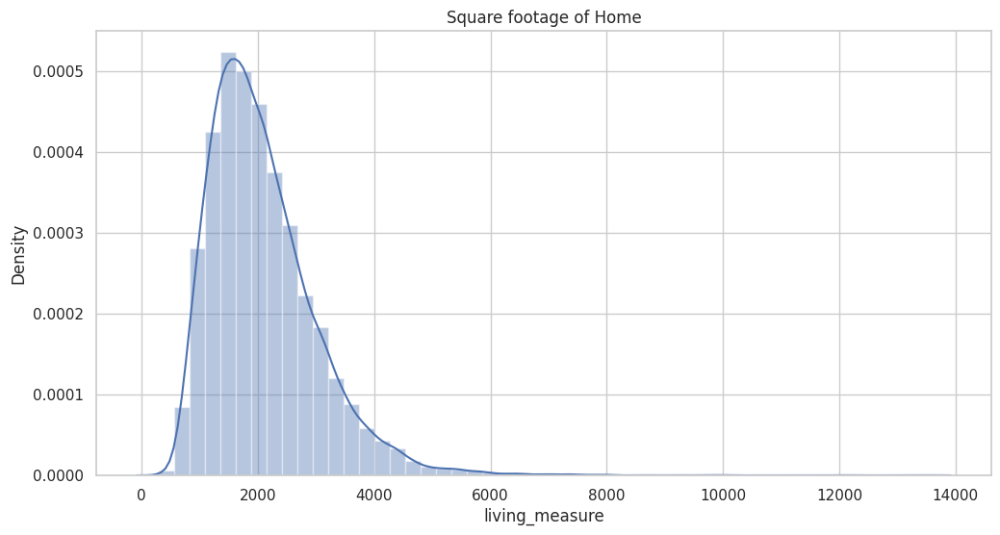

In [ ]:
#Living measure(Square footage of the home)
plt.figure(figsize=(12,6))
sns.distplot(Data_new.living_measure).set(title='Square footage of Home');
Data_new.living_measure.describe()

In [ ]:
#Coast(House with Waterfront View)
Data_new.coast.value_counts()

0.0000    21227
1.0000    160  
Name: coast, dtype: int64

160 houses has waterfront view

In [ ]:
#Sight(Number of times sight has been viewed)
Data_new.sight.value_counts()

0.0000    19251
2.0000    951  
3.0000    504  
1.0000    331  
4.0000    316  
Name: sight, dtype: int64

Most of the houses hasn't been viewed.

In [ ]:
#Condition of the house
Data_new.condition.value_counts()

3.0000    13859
4.0000    5615 
5.0000    1679 
2.0000    171  
1.0000    29   
Name: condition, dtype: int64

Majority of the house falls in category of 3.

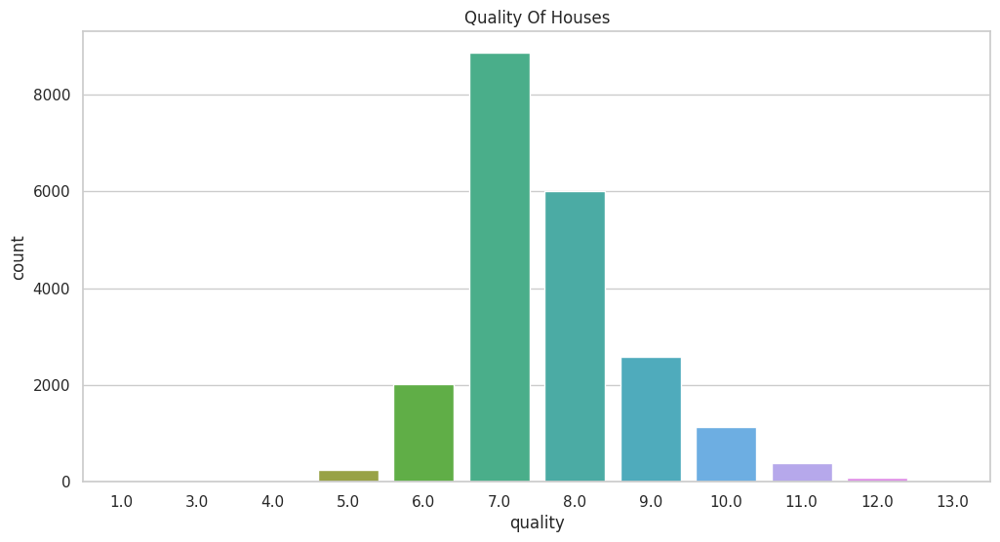

In [ ]:
#Quality of the houses
Data_new.quality.value_counts()
plt.figure(figsize=(12,6))
sns.countplot(x=Data_new.quality).set(title='Quality Of Houses');

Most properties have qualities ranging between 6 to 10.Highest is 7.

Skewness is:  1.424164832918211


count   21353.0000
mean    1788.9038 
std     827.3027  
min     290.0000  
25%     1190.0000 
50%     1560.0000 
75%     2210.0000 
max     9410.0000 
Name: ceil_measure, dtype: float64

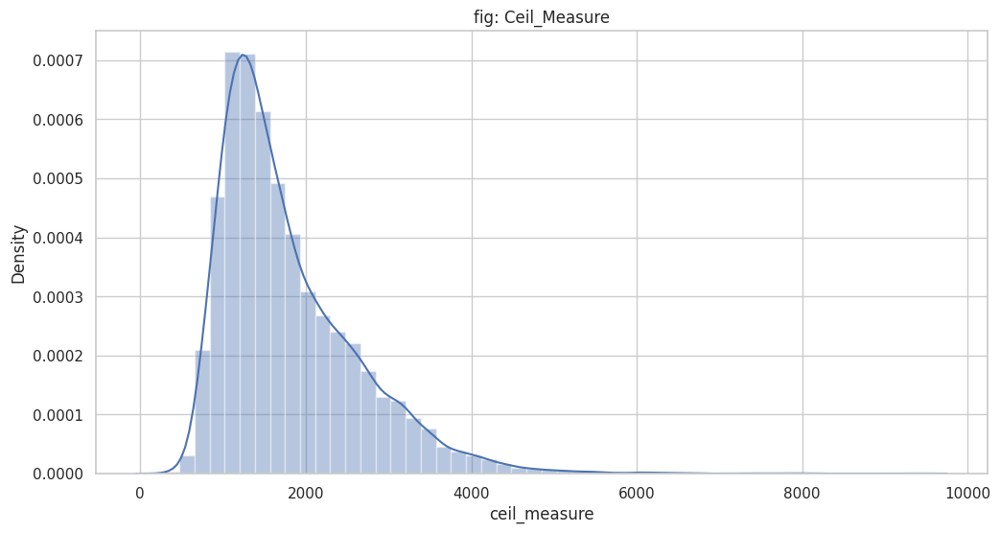

In [ ]:
#Ceil_measure and its Skewness check

plt.figure(figsize=(12,6))
print("Skewness is: " ,Data_new.ceil_measure.skew())
sns.distplot(Data_new.ceil_measure).set(title ='fig: Ceil_Measure');
Data_new.ceil_measure.describe()


Skewness is:  1.579688276721319


count   21353.0000
mean    291.2663  
std     442.6699  
min     0.0000    
25%     0.0000    
50%     0.0000    
75%     560.0000  
max     4820.0000 
Name: basement, dtype: float64

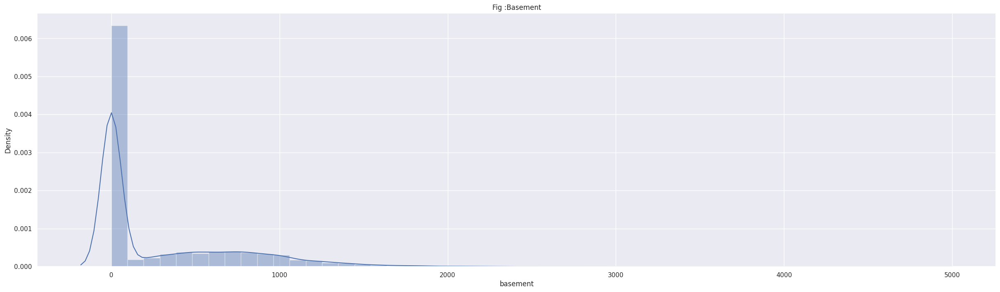

In [ ]:
#Basement measure
plt.figure(figsize=(30,8))
print("Skewness is: " ,Data_new.basement.skew())
sns.distplot(Data_new.basement).set(title='Fig :Basement');
Data_new.basement.describe()


Skewness is >1,the distribution is extremely skewed.

In [ ]:
Data_new.basement.value_counts()

0.0000       12983
600.0000     218  
700.0000     216  
500.0000     209  
800.0000     202  
            ...   
4130.0000    1    
2050.0000    1    
784.0000     1    
518.0000     1    
2180.0000    1    
Name: basement, Length: 305, dtype: int64

More than >50% of properties doesn't have basement.

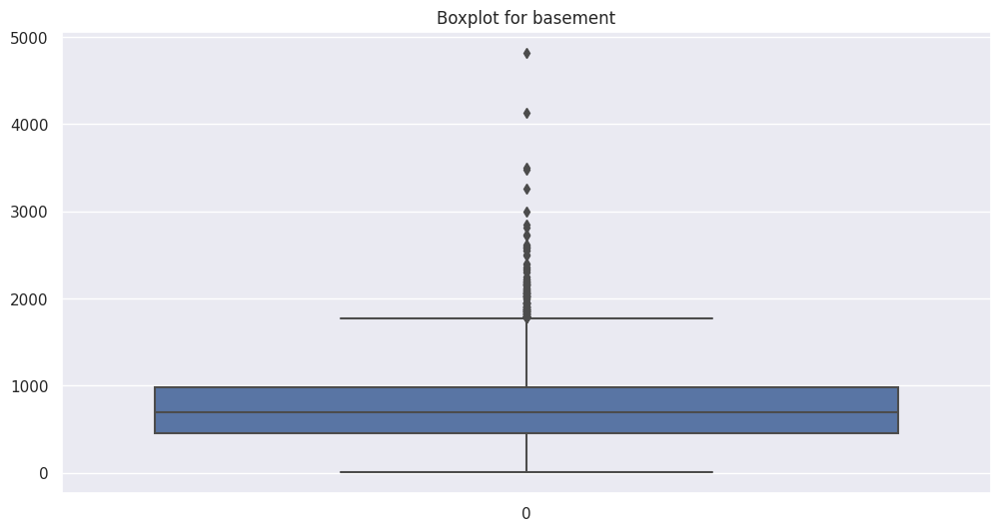

In [ ]:
#Boxplot for basement_measure
hdf_base=Data_new[Data_new['basement']>0]
plt.figure(figsize=(12,6));
sns.boxplot(hdf_base['basement']).set(title='Boxplot for basement');


There are many outliers that needs to be addressed.

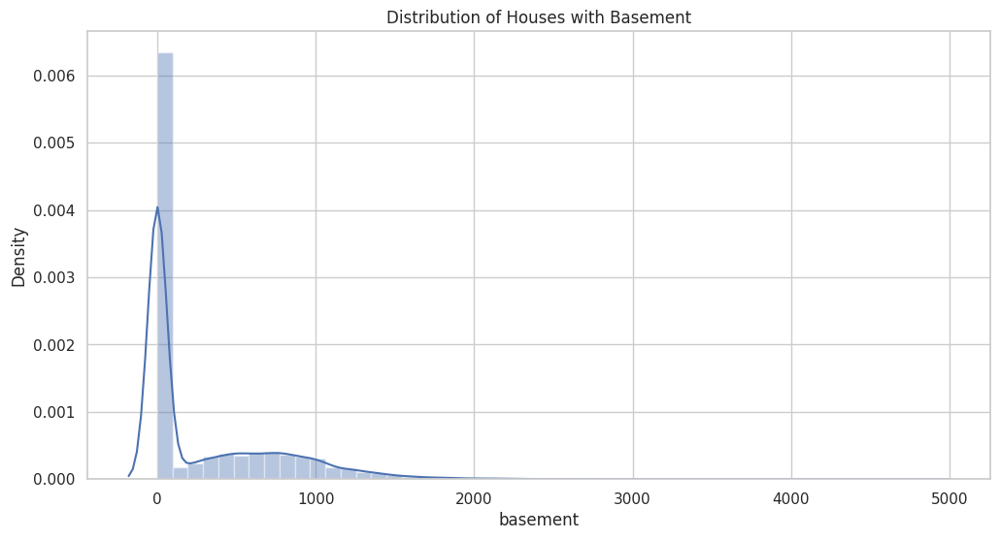

In [ ]:
#Distribution of houses with basement
plt.figure(figsize=(12,6))
sns.distplot(Data_new.basement).set(title='Distribution of Houses with Basement');

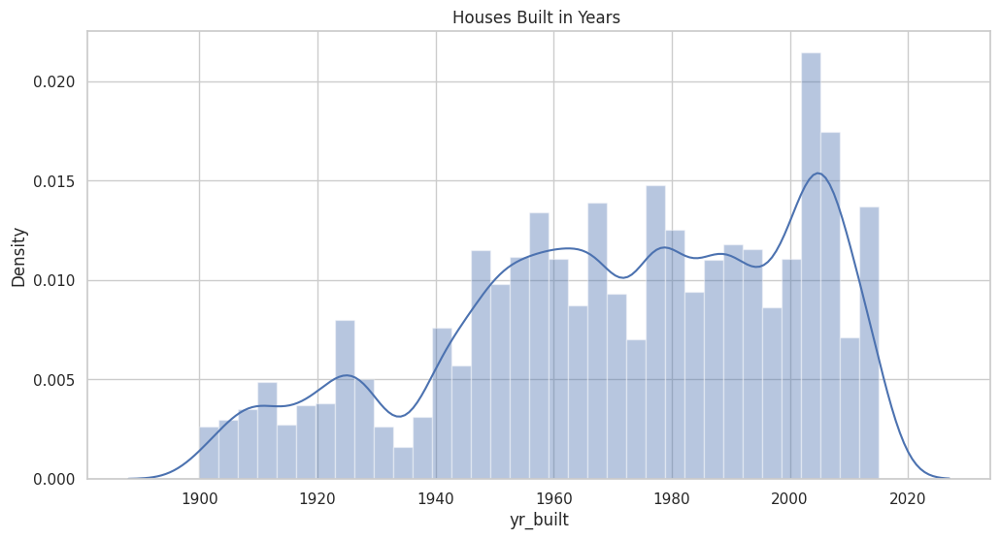

In [ ]:
#Year Built
plt.figure(figsize=(12,6))
sns.distplot(Data_new.yr_built).set(title='Houses Built in Years ');

In [ ]:
#Value Count for year built
Data_new.yr_built.value_counts(ascending=False)

2014    554
2006    449
2005    445
2004    428
2003    415
       ... 
1933    29 
1901    28 
1902    27 
1935    24 
1934    21 
Name: yr_built, Length: 116, dtype: int64

More Properties built in the year 2014

0.0000    17147
1.0000    4206 
Name: furnished, dtype: int64

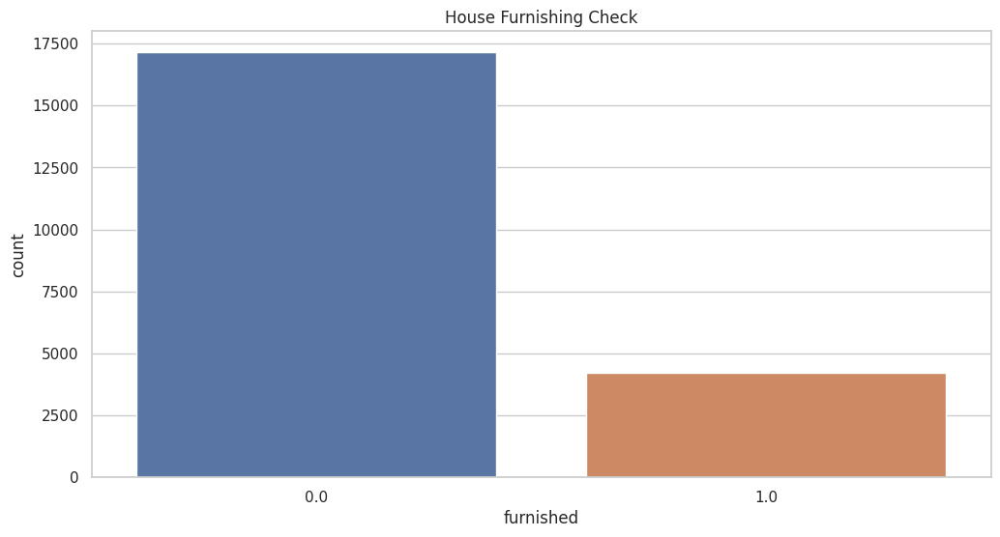

In [ ]:
#Furnished (Based on the Quality of Room)
fig =plt.figure(figsize=(12,6))
sns.countplot(x=Data_new.furnished).set(title='House Furnishing Check');
Data_new.furnished.value_counts()

# **BIVARIATE ANALYSIS**

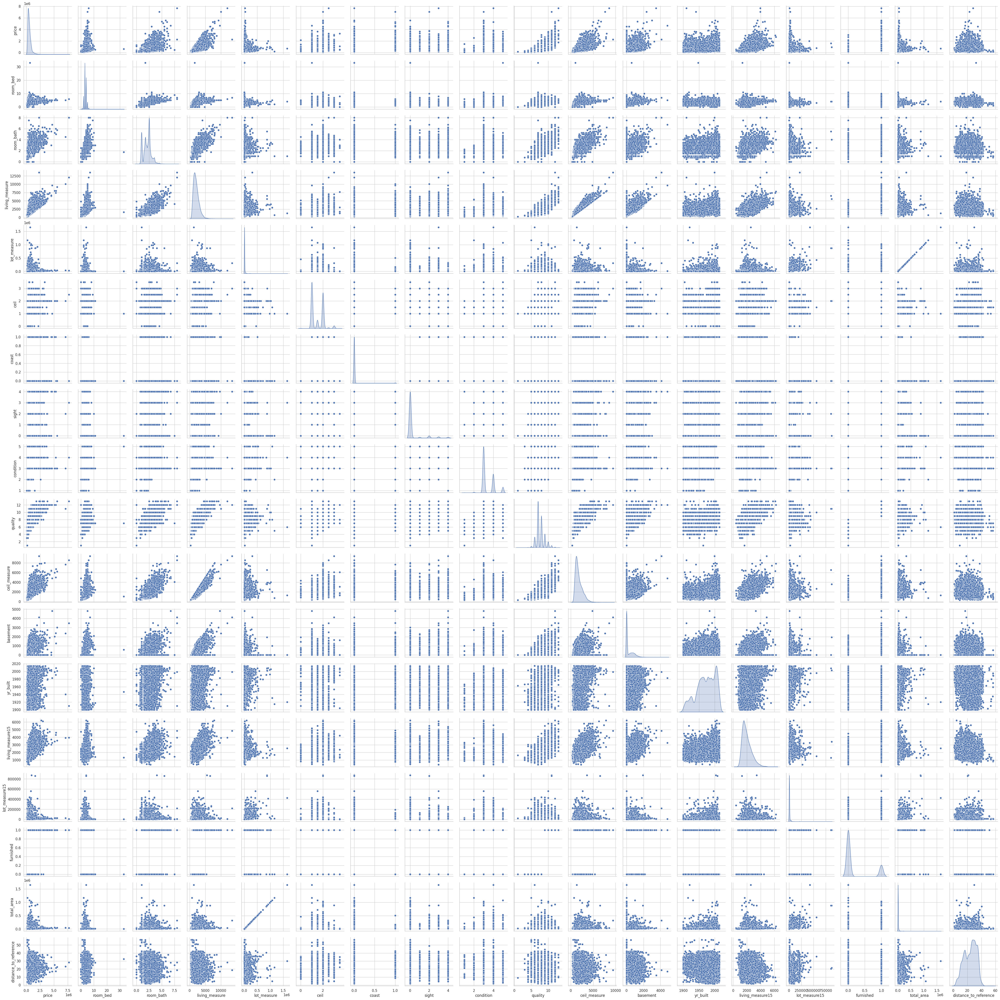

In [ ]:
#Pair Plot
# let's plot all the variables and confirm our above deduction with more confidence
sns.pairplot(Data_new, diag_kind = 'kde')

In [ ]:
# let's see corelation between the different features
house_corr = Data_new.corr(method ='pearson')
house_corr

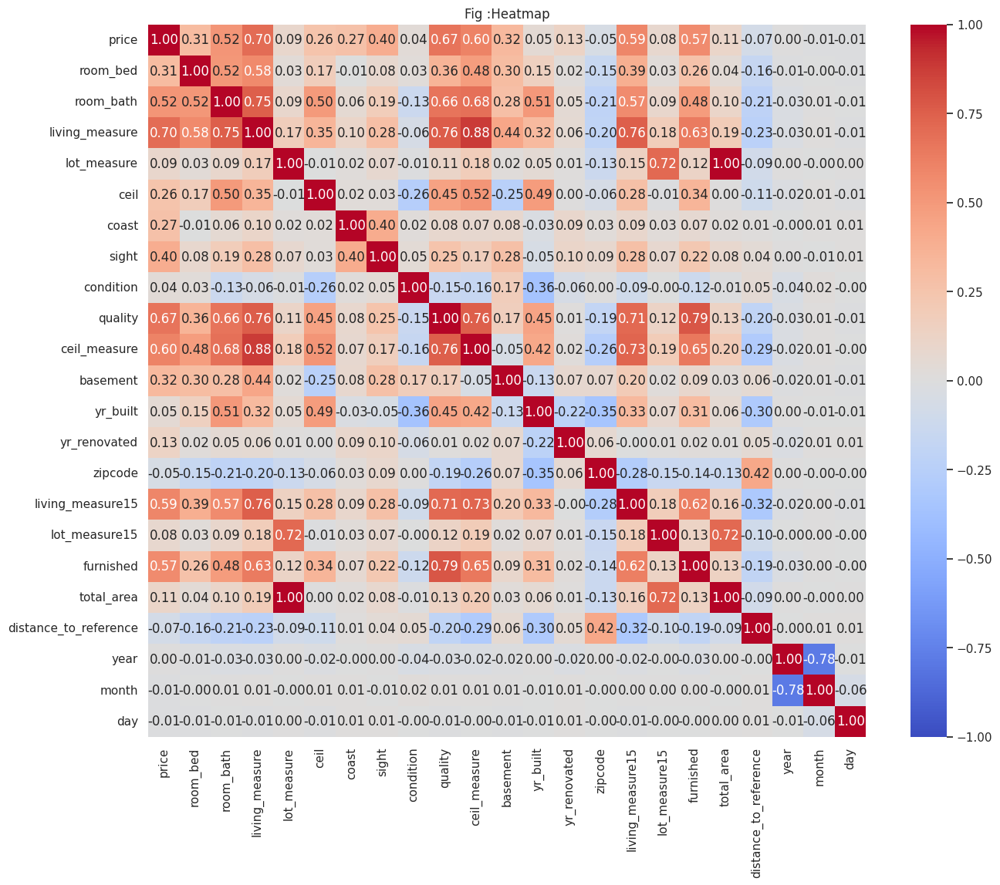

In [ ]:
plt.figure(figsize=(15, 12))
sns.heatmap(Data_new.corr(), vmin=-1, vmax=1, cmap="coolwarm", annot=True, fmt=".2f").set(title='Fig :Heatmap')
plt.show()

[Text(0.5, 1.0, 'Fig2 :Heatmap')]

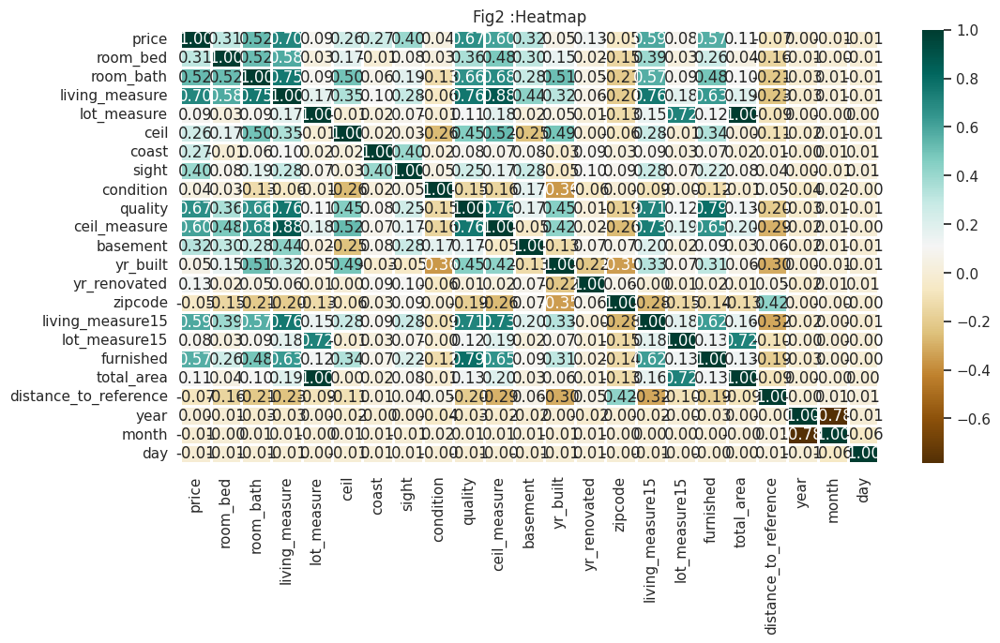

In [ ]:
#Plotting heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(Data_new.corr(),
            cmap = 'BrBG',
            fmt = '.2f',
            linewidths = 2,
            annot = True).set(title='Fig2 :Heatmap')

# **Living_Measure v/s price**

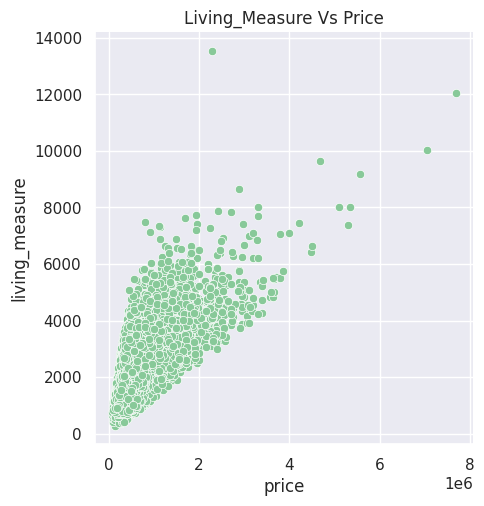

In [ ]:
sns.relplot(
    data=Data_new,
    x="price", y="living_measure",color = '#88c999'
).set(title='Living_Measure Vs Price')


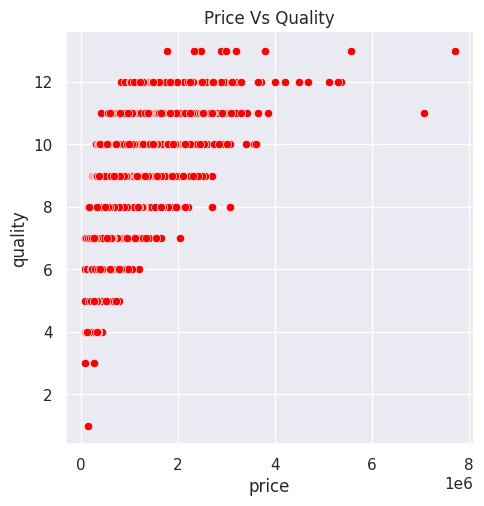

In [ ]:
#Relationship between price,quality
sns.relplot(
    data=Data_new,
    x="price", y="quality" ,color = 'red'
).set(title='Price Vs Quality')

# **condition v/s Price**
Mean and median for price with respect to condition


price                    living_measure                 
                 mean      median   size           mean    median   size
condition                                                               
1.0000    326998.2759 255000.0000  29    1200.6897      990.0000   29   
2.0000    326423.3275 279000.0000  171   1414.1520      1330.0000  171  
3.0000    542303.3945 451000.0000  13859 2150.1398      1970.0000  13859
4.0000    520408.9181 439950.0000  5615  1950.2746      1820.0000  5615 
5.0000    612769.9166 525000.0000  1679  2020.0429      1870.0000  1679

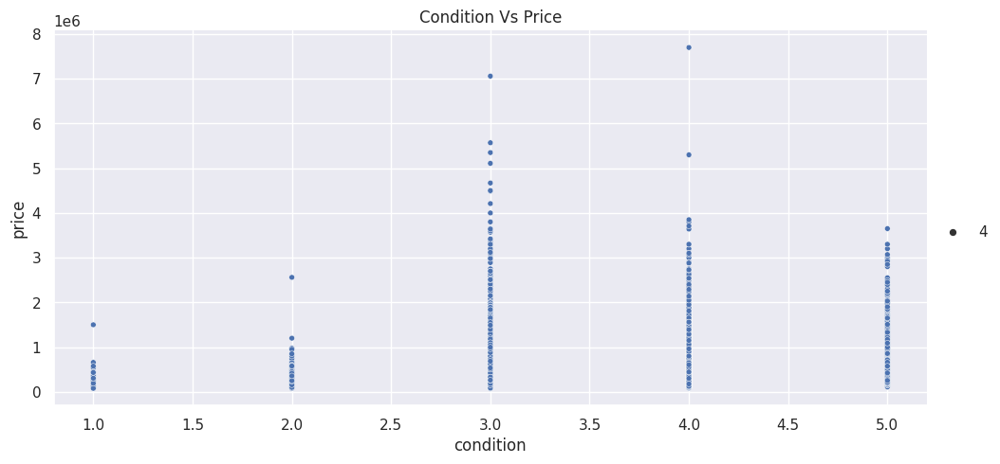

In [ ]:
print(sns.relplot(x='condition',y='price',data=Data_new, size = 4, aspect = 2).set(title='Condition Vs Price'));
#groupby
Data_new.groupby('condition')['price','living_measure'].agg(['mean','median','size'])


# **Ceil_measure v/s Price**

<Figure size 1200x800 with 0 Axes>

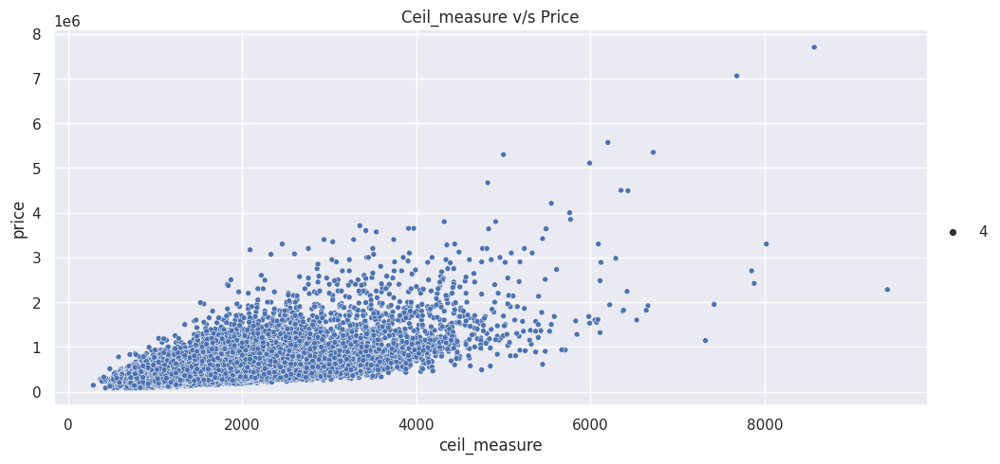

In [ ]:
plt.figure(figsize=(12, 8))
print(sns.relplot(x='ceil_measure',y='price',data=Data_new, size = 4, aspect = 2).set(title='Ceil_measure v/s Price'));


ceil measure - price increases with increase in ceil measure. There is upward trend in price with ceil_measure

# **Basement v/s price**

<Figure size 1200x800 with 0 Axes>

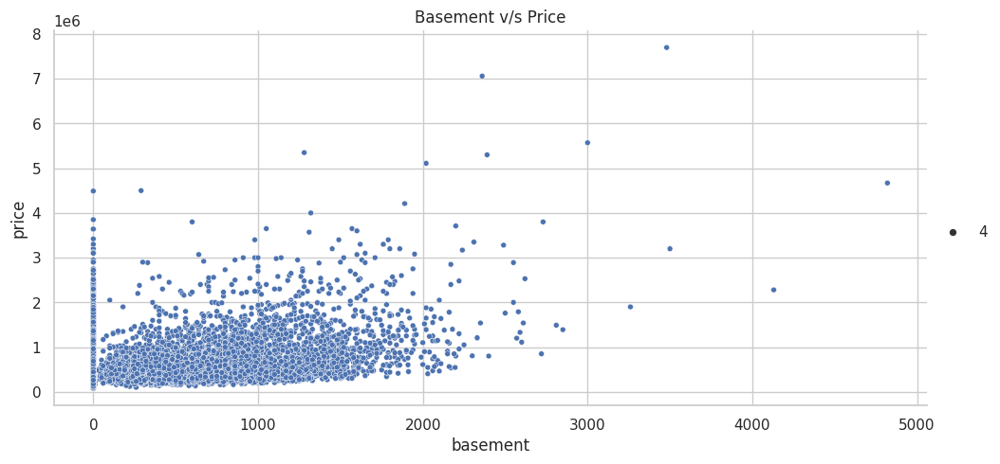

In [ ]:
plt.figure(figsize=(12, 8))
print(sns.relplot(x='basement',y='price',data=Data_new, size = 4, aspect = 2).set(title='Basement v/s Price'));

We will create the categorical variable for basement 'has_basement' for houses with basement and no basement. This categorical variable will be used for further analysis

In [ ]:
def create_basement_group(series):
 if series == 0:
  return "No"
 elif series > 0:
  return "yes"
Data_new['has_basement'] = Data_new['basement'].apply(create_basement_group)

price                    living_measure                 
                    mean      median   size           mean    median   size
has_basement                                                               
No           487184.9050 411100.0000  12983 1929.5543      1740.0000  12983
yes          622090.7080 515000.0000  8370  2313.7956      2100.0000  8370

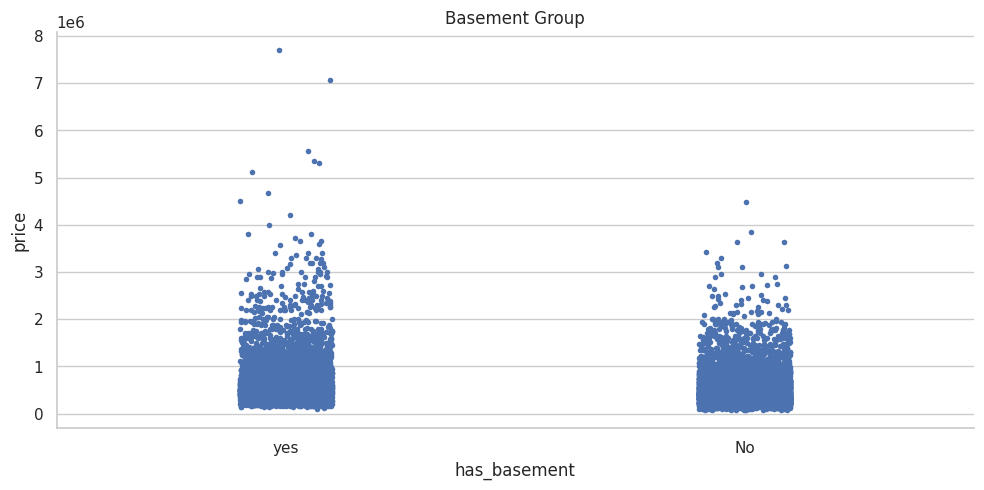

In [ ]:
#basement - after binning the data ,houses with basement are costlier and have higher Living measure (mean & median)

print(sns.catplot(x='has_basement',y='price' ,data=Data_new, size = 4, aspect = 2).set(title='Basement Group'));
Data_new.groupby('has_basement') ['price','living_measure'].agg(['mean','median','size'])


# **furnished v/s Price**

price                    living_measure                 
                 mean      median   size           mean    median   size
furnished                                                               
0.0000    437187.2753 400000.0000  17147 1792.1613      1720.0000  17147
1.0000    959479.4670 810000.0000  4206  3254.3229      3110.0000  4206

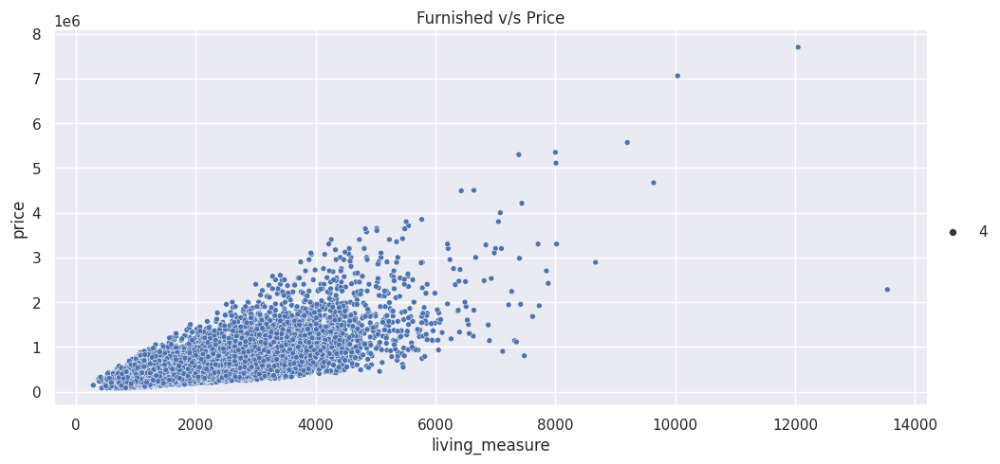

In [ ]:
print(sns.relplot(x='living_measure',y='price', data=Data_new,size = 4, aspect = 2).set(title='Furnished v/s Price'));
#groupby
Data_new.groupby('furnished')['price','living_measure'].agg(['mean','median','size'])


furnished - Furnished has higher price value and has greater living_measure. Furnished houses have higher price than that of the Non-furnished houses

price                    living_measure                
                mean       median  size           mean    median  size
quality                                                               
1.0000  142000.0000  142000.0000   1    290.0000       290.0000   1   
3.0000  205666.6667  262000.0000   3    596.6667       600.0000   3   
4.0000  214381.0345  205000.0000   29   660.4828       660.0000   29  
5.0000  247824.1708  228700.0000   240  980.4375       900.0000   240 
6.0000  301934.8017  275750.0000   2012 1191.8748      1120.0000  2012
7.0000  402444.4730  375000.0000   8859 1689.5874      1630.0000  8859
8.0000  542603.3570  510000.0000   6003 2183.4989      2150.0000  6003
9.0000  773712.3117  720000.0000   2583 2869.0612      2820.0000  2583
10.0000 1072784.0089 914500.0000   1127 3521.2334      3450.0000  1127
11.0000 1495860.8096 1280000.0000  394  4387.3959      4260.0000  394 
12.0000 2192500.0000 1820000.0000  90   5471.5889      4965.0000  90  
13.0000 3445833.3333 2935000.0000  12   7282.5000      7075.0000  12

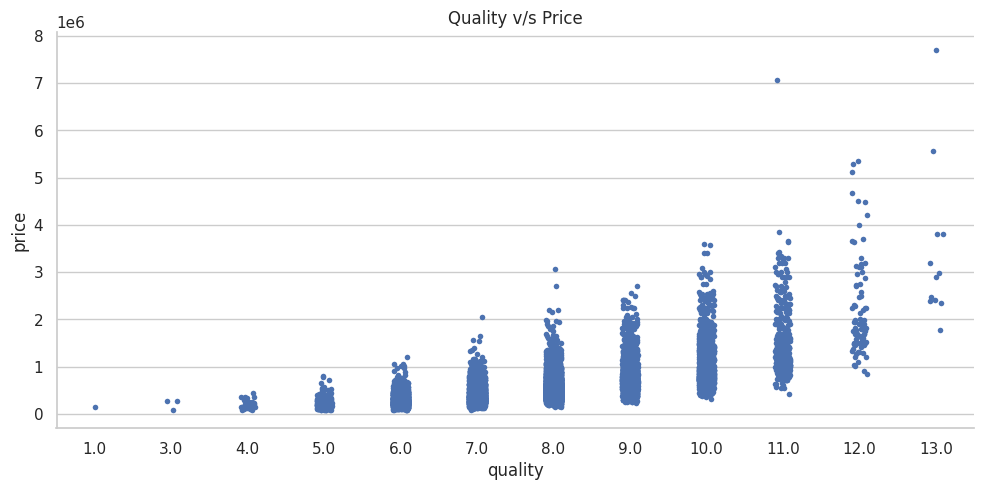

In [ ]:
#quality - with grade increase, price and living_measure increases (mean and median)

print(sns.catplot(x='quality',y='price',data=Data_new, size = 4, aspect = 2).set(title='Quality v/s Price'))
#groupby
Data_new.groupby('quality')['price','living_measure'].agg(['mean','median','size'])


# **Ceil v/s Price (Number of floors)**

,mean,median,size
ceil,,,
0.0000,595226.6667,447250.0000,30
1.0000,442270.8736,389525.0000,10526
1.5000,559162.8008,523230.0000,1888
2.0000,648130.2862,542063.0000,8132
2.5000,1062483.5312,789600.0000,160
3.0000,583016.6043,490000.0000,609
3.5000,933937.5000,534500.0000,8


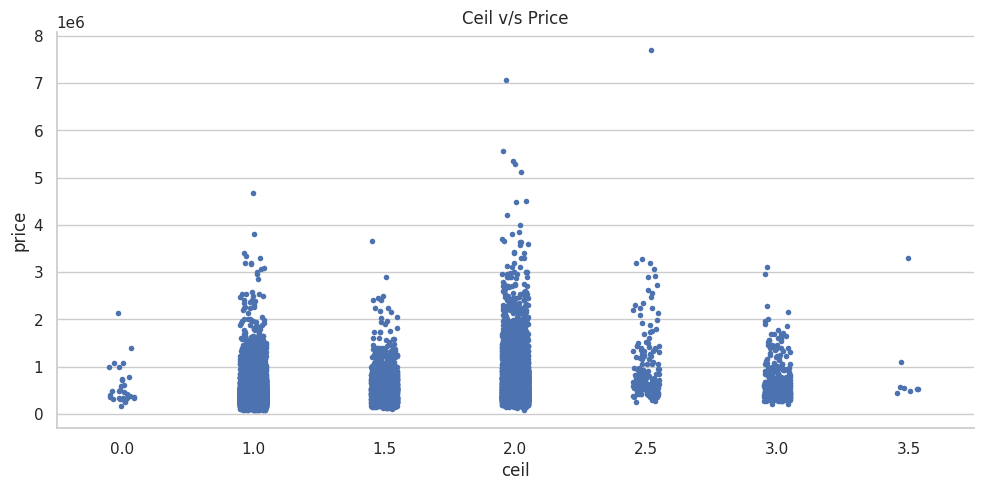

In [ ]:
print(sns.catplot(x='ceil' ,y='price' ,data=Data_new, size = 4, aspect = 2,kind="strip").set(title='Ceil v/s Price'))
#groupby
Data_new.groupby('ceil')['price'].agg(['mean','median','size' ])


living_measure                  price             
               median      mean       median         mean
coast                                                    
0.0000 1910.0000      2071.9856 450000.0000  531547.4169 
1.0000 2830.0000      3164.2562 1395000.0000 1668352.7625

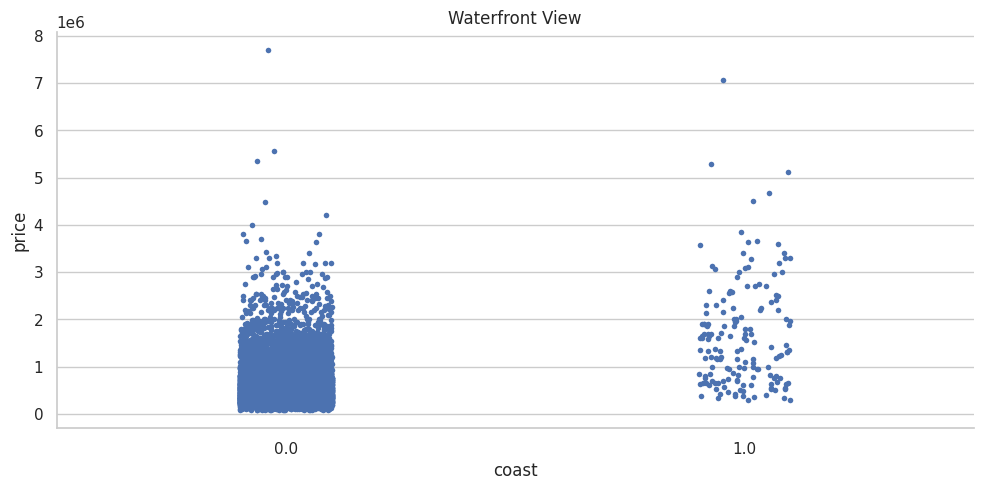

In [ ]:
#coast - mean and median of waterfront view is high however such houses are very small in compare to non-waterfront
#Also, living_measure mean and median is greater for waterfront house.
print(sns.catplot(x='coast',y='price',data=Data_new, size = 4, aspect = 2).set(title ='Waterfront View'))
#groupby
Data_new.groupby('coast')['living_measure','price'].agg(['median','mean'])

# **Sight v/s Price**

price                     living_measure                 
               mean       median   size           mean    median   size
sight                                                                  
0.0000 496623.2674  432000.0000   19251 1998.2316      1850.0000  19251
1.0000 813843.4381  693000.0000   331   2573.2779      2420.0000  331  
2.0000 791801.8770  675000.0000   951   2654.1882      2460.0000  951  
3.0000 974853.9286  802500.0000   504   3017.3175      2840.0000  504  
4.0000 1448779.0665 1185000.0000  316   3333.2278      3050.0000  316

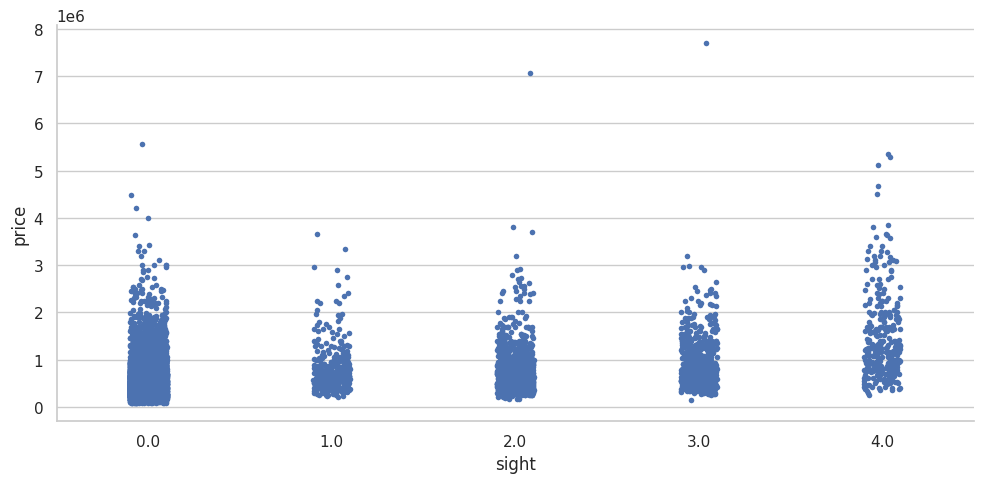

In [ ]:
print(sns.catplot(x='sight',y='price',data=Data_new, size = 4, aspect = 2));
#groupby
Data_new.groupby('sight')['price','living_measure'].agg(['mean','median','size'])


In [ ]:
Data_new.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'zipcode', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area', 'distance_to_reference',
       'year', 'month', 'day', 'has_basement'],
      dtype='object')

In [ ]:
DATA_NEW=Data_new.copy()

# **Outliers handling**

We have seen outliers in many of the attributes like columns room_bath, living_measure, lot_measure, ceil_measure and Basement

In [ ]:
DATA_NEW.describe()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day
count,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000,21353.0000
mean,540065.6043,3.3703,2.1145,2080.1701,15117.4548,1.4929,0.0075,0.2346,3.4095,7.6580,1788.9038,291.2663,1971.0404,83.8388,98077.8847,1987.2046,12766.0547,0.1970,17177.1937,24.0651,2014.3230,6.5726,15.6881
std,365588.3644,0.9298,0.7686,917.5419,41480.0092,0.5429,0.0862,0.7667,0.6506,1.1761,827.3027,442.6699,29.3824,400.3897,53.5001,685.4745,27259.9538,0.3977,41652.7187,8.6243,0.4676,3.1151,8.6294
min,75000.0000,0.0000,0.0000,290.0000,520.0000,0.0000,0.0000,0.0000,1.0000,1.0000,290.0000,0.0000,1900.0000,0.0000,98001.0000,399.0000,651.0000,0.0000,0.0000,1.6097,2014.0000,1.0000,1.0000
25%,321500.0000,3.0000,1.7500,1430.0000,5040.0000,1.0000,0.0000,0.0000,3.0000,7.0000,1190.0000,0.0000,1951.0000,0.0000,98033.0000,1490.0000,5100.0000,0.0000,7020.0000,16.9190,2014.0000,4.0000,8.0000
50%,450000.0000,3.0000,2.2500,1910.0000,7620.0000,1.5000,0.0000,0.0000,3.0000,7.0000,1560.0000,0.0000,1975.0000,0.0000,98065.0000,1840.0000,7620.0000,0.0000,9568.0000,25.4170,2014.0000,6.0000,16.0000
75%,645000.0000,4.0000,2.5000,2550.0000,10685.0000,2.0000,0.0000,0.0000,4.0000,8.0000,2210.0000,560.0000,1997.0000,0.0000,98117.0000,2360.0000,10083.0000,0.0000,12978.0000,31.0356,2015.0000,9.0000,23.0000
max,7700000.0000,33.0000,8.0000,13540.0000,1651359.0000,3.5000,1.0000,4.0000,5.0000,13.0000,9410.0000,4820.0000,2015.0000,2015.0000,98199.0000,6210.0000,871200.0000,1.0000,1652659.0000,56.6891,2015.0000,12.0000,31.0000


In [ ]:
def outlier_treatment(datacolumn):
    sorted(datacolumn)
    Q1,Q3 = np.percentile(datacolumn , [25,75])
    IQR = Q3-Q1
    lower_range = Q1-(1.5 * IQR)
    upper_range = Q3+(1.5 * IQR)
    return lower_range,upper_range

In [ ]:
hdf_with_outlier = DATA_NEW.copy()	#—> dataframe with outLiers

In [ ]:
hdf_log_trans = DATA_NEW.copy()	#	> dataframe after Log Transformation

Let us have 3 dataframes
1.	DATA_NEW: without outliers (Its outliers are found and dropped)
2.	hdf_log_trans: The columns where outliers are found that particular column is log transformed
3.	hdf_with_outlier: The dataframe with outliers.
All the three dataframe have been considered for model building seperately


# **Treating outliers for column - ceil_measure**

In [ ]:
lowerbound,upperbound = outlier_treatment(DATA_NEW.ceil_measure)
print(lowerbound,upperbound)

-340.0 3740.0


Lower bound and upper bound values ranges from -340 to 3740

In [ ]:
DATA_NEW[(DATA_NEW.ceil_measure < lowerbound) | (DATA_NEW.ceil_measure > upperbound)]

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day,has_basement
127,1050000,4.0000,3.2500,4160.0000,47480.0000,2.0000,0.0000,0.0000,3.0000,10.0000,4160.0000,0.0000,1995,0,98072,3400.0000,40428.0000,1.0000,51640.0000,26.6362,2014,12,16,No
155,2140000,6.0000,4.0000,5110.0000,7128.0000,2.5000,0.0000,0.0000,4.0000,11.0000,5110.0000,0.0000,1906,0,98112,4110.0000,6480.0000,1.0000,12238.0000,26.9712,2015,3,4,No
161,775000,3.0000,2.5000,3820.0000,35016.0000,2.0000,0.0000,0.0000,4.0000,9.0000,3820.0000,0.0000,1987,0,98053,3010.0000,35190.0000,1.0000,38836.0000,16.9165,2014,12,10,No
178,1140000,5.0000,4.0000,7320.0000,217800.0000,2.0000,0.0000,0.0000,3.0000,11.0000,7320.0000,0.0000,1992,0,98058,3270.0000,34500.0000,1.0000,225120.0000,8.7382,2014,7,8,No
184,1600000,6.0000,5.0000,6050.0000,230652.0000,2.0000,0.0000,3.0000,3.0000,11.0000,6050.0000,0.0000,2001,0,98024,4210.0000,233971.0000,1.0000,236702.0000,12.2603,2014,6,18,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21498,665000,4.0000,3.5000,3770.0000,47480.0000,2.0000,0.0000,0.0000,3.0000,9.0000,3770.0000,0.0000,2003,0,98010,3380.0000,42689.0000,1.0000,51250.0000,16.1164,2014,9,3,No
21518,920000,4.0000,3.5000,4080.0000,10666.0000,2.0000,0.0000,0.0000,3.0000,9.0000,4080.0000,0.0000,2005,0,98053,3920.0000,8154.0000,1.0000,14746.0000,20.2868,2014,7,1,No
21564,805000,3.0000,3.0000,3910.0000,19023.0000,2.0000,0.0000,0.0000,3.0000,11.0000,3910.0000,0.0000,1985,0,98014,1860.0000,15001.0000,1.0000,22933.0000,22.6567,2014,6,19,No
21570,1840000,4.0000,3.5000,4870.0000,39190.0000,2.0000,0.0000,0.0000,3.0000,12.0000,4870.0000,0.0000,1995,0,98006,5000.0000,33880.0000,1.0000,44060.0000,10.5787,2015,1,27,No


We got 605 records which are outliers.

# **Dropping the outliers records from dataset**

In [ ]:
#dropping the outliers record from the dataset

DATA_NEW.drop(DATA_NEW[(DATA_NEW.ceil_measure < lowerbound) | (DATA_NEW.ceil_measure > upperbound)].index, inplace=True)

All the outliers values in both upper and lower limit have been removed

In [ ]:
DATA_NEW.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'zipcode', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area', 'distance_to_reference',
       'year', 'month', 'day', 'has_basement'],
      dtype='object')

In [ ]:
DATA_NEW.shape

(20748, 24)

Skewness is : 0.8189691104793275


count   20748.0000
mean    1712.8461 
std     696.4690  
min     290.0000  
25%     1180.0000 
50%     1540.0000 
75%     2140.0000 
max     3740.0000 
Name: ceil_measure, dtype: float64

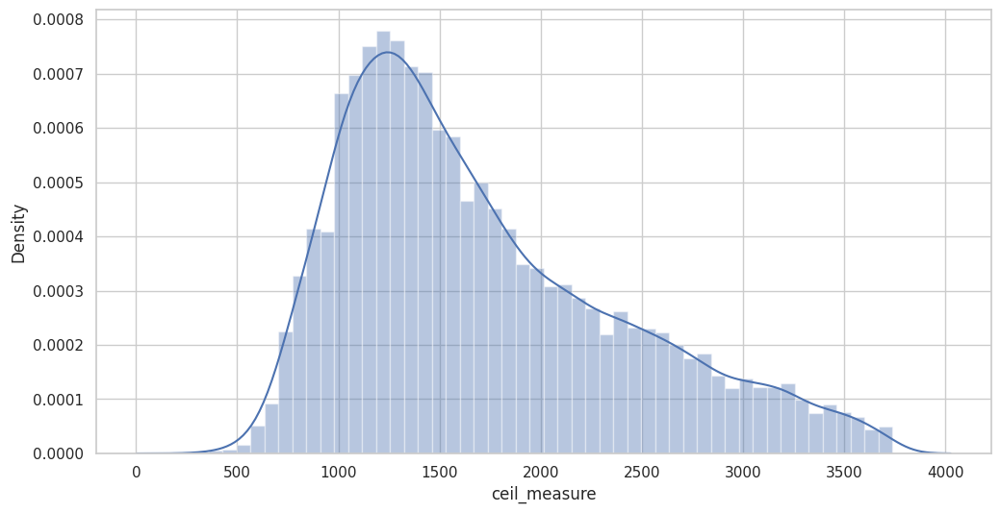

In [ ]:
#ceil_measure
print("Skewness is :", DATA_NEW.ceil_measure.skew())
plt.figure(figsize=(12, 6))
sns.distplot(DATA_NEW.ceil_measure)
DATA_NEW.ceil_measure.describe()

After treating outliers of ceil_measure, the data has reduced by about 600(~3%) data points but data is nicely distributed

# *Let us analyse by log transform*

In [ ]:
# Let us analyze also by considering Log transformation
hdf_log_trans['ceil_measure_log'] = np.log10(hdf_log_trans.ceil_measure)


In [ ]:
hdf_log_trans.drop(['ceil_measure'],axis=1,inplace=True)
hdf_log_trans.head(2)


,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day,has_basement,ceil_measure_log
0,600000,4.0000,1.7500,3050.0000,9440.0000,1.0000,0.0000,0.0000,3.0000,8.0000,1250.0000,1966,0,98034,2020.0000,8660.0000,0.0000,12490.0000,28.3360,2015,4,27,yes,3.2553
1,190000,2.0000,1.0000,670.0000,3101.0000,1.0000,0.0000,0.0000,4.0000,6.0000,0.0000,1948,0,98118,1660.0000,4100.0000,0.0000,3771.0000,21.5079,2015,3,17,No,2.8261


Only 'ceil_measure_log' is considered and the original column have been dropped

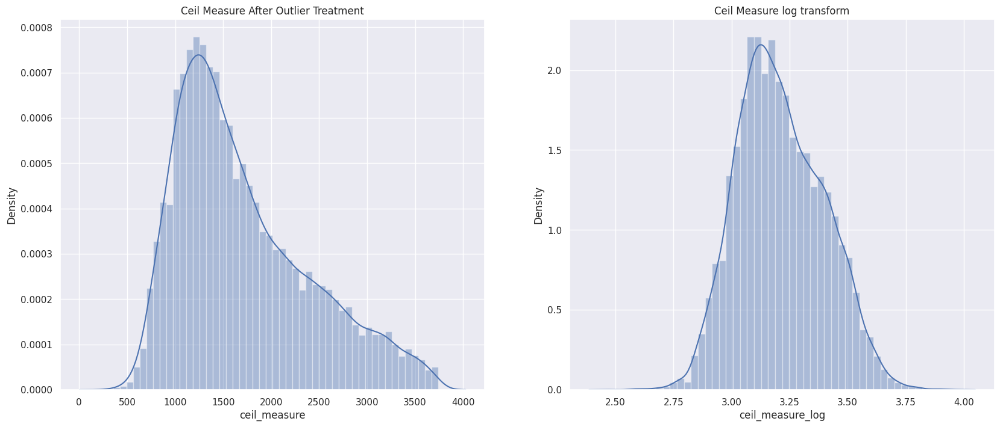

In [ ]:
plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
sns.distplot(DATA_NEW.ceil_measure).set(title ='Ceil Measure After Outlier Treatment');
plt.subplot(1,2,2)
sns.distplot(hdf_log_trans.ceil_measure_log).set(title ='Ceil Measure log transform');


After log transformation distribution found almost normal

In [ ]:
#ceil_measure
print("Skewness after droping outlier is :",  DATA_NEW.ceil_measure.skew())
print("Skewness after log transformation is :", hdf_log_trans.ceil_measure_log.skew())


Skewness after droping outlier is : 0.8189691104793275
Skewness after log transformation is : 0.2498974853710667


# **Treating outliers for column - living_measure**

In [ ]:
lowerbound_lim, upperbound_lim = outlier_treatment(DATA_NEW.living_measure)
print(lowerbound_lim,upperbound_lim)


-195.0 4085.0


In [ ]:
DATA_NEW[(DATA_NEW.living_measure < lowerbound_lim) | (DATA_NEW.living_measure > upperbound_lim)]

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day,has_basement
7,1160000,4.0000,3.5000,4680.0000,9700.0000,2.0000,0.0000,0.0000,3.0000,10.0000,3360.0000,1320.0000,2005,0,98006,2800.0000,12343.0000,1.0000,14380.0000,14.6776,2014,6,18,yes
173,975000,4.0000,2.5000,4270.0000,43386.0000,1.0000,0.0000,0.0000,3.0000,10.0000,2680.0000,1590.0000,1991,0,98053,3630.0000,36180.0000,1.0000,47656.0000,21.6613,2014,6,18,yes
440,1250000,4.0000,4.2500,4980.0000,13000.0000,2.0000,0.0000,3.0000,3.0000,9.0000,3080.0000,1900.0000,1982,0,98052,2840.0000,11308.0000,1.0000,17980.0000,17.3815,2014,11,25,yes
468,1150000,5.0000,3.5000,4350.0000,6218.0000,2.0000,0.0000,2.0000,3.0000,10.0000,3520.0000,830.0000,2007,0,98027,3260.0000,5989.0000,1.0000,10568.0000,4.4086,2014,10,6,yes
488,1730000,5.0000,3.5000,5000.0000,26540.0000,2.0000,0.0000,3.0000,3.0000,10.0000,3410.0000,1590.0000,2008,0,98040,3360.0000,17398.0000,1.0000,31540.0000,17.4553,2014,6,30,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21146,850000,4.0000,3.2500,4350.0000,112750.0000,1.0000,0.0000,0.0000,3.0000,9.0000,2200.0000,2150.0000,2006,0,98027,2180.0000,223027.0000,1.0000,117100.0000,5.4724,2014,7,1,yes
21339,700000,4.0000,3.5000,4490.0000,5099.0000,2.0000,0.0000,0.0000,3.0000,9.0000,3390.0000,1100.0000,2006,0,98065,4290.0000,5537.0000,1.0000,9589.0000,11.3484,2014,5,28,yes
21351,1210000,4.0000,3.5000,4560.0000,16643.0000,1.0000,0.0000,3.0000,3.0000,12.0000,2230.0000,2330.0000,1995,0,98006,4060.0000,15177.0000,1.0000,21203.0000,10.4189,2014,5,20,yes
21496,1050000,6.0000,4.0000,5310.0000,12741.0000,2.0000,0.0000,2.0000,3.0000,10.0000,3600.0000,1710.0000,1967,0,98040,4190.0000,12632.0000,1.0000,18051.0000,17.8068,2015,4,23,yes


We got 292 records as outliers. Let's treat this by dropping

In [ ]:
DATA_NEW[(DATA_NEW.living_measure < lowerbound_lim) | (DATA_NEW.living_measure > upperbound_lim)]
DATA_NEW.drop(DATA_NEW[(DATA_NEW.living_measure>upperbound_lim) | (DATA_NEW.living_measure<lowerbound_lim)].index,inplace=True)


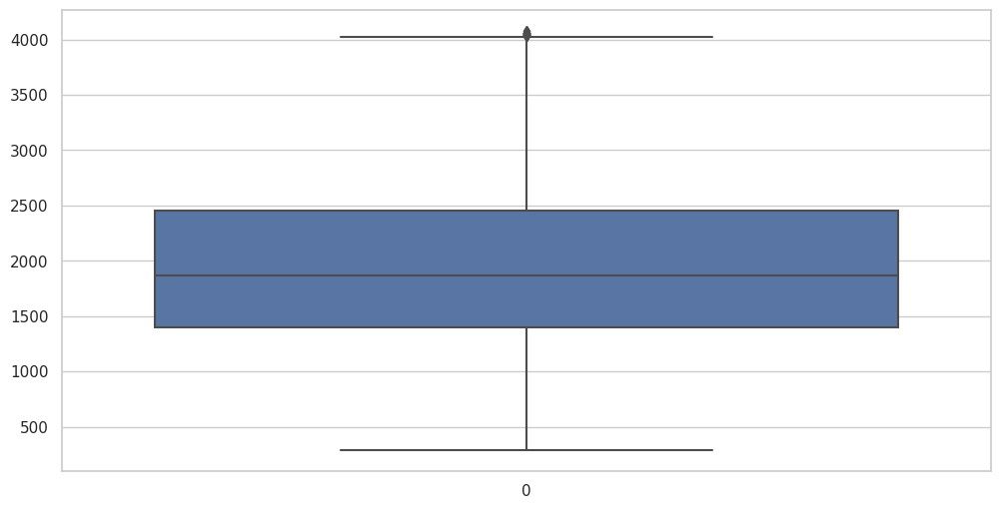

In [ ]:
#let's see the boxplot after dropping the outliers
plt.figure(figsize=(12, 6))
sns.boxplot(DATA_NEW['living_measure']);

<Axes: xlabel='living_measure', ylabel='Density'>

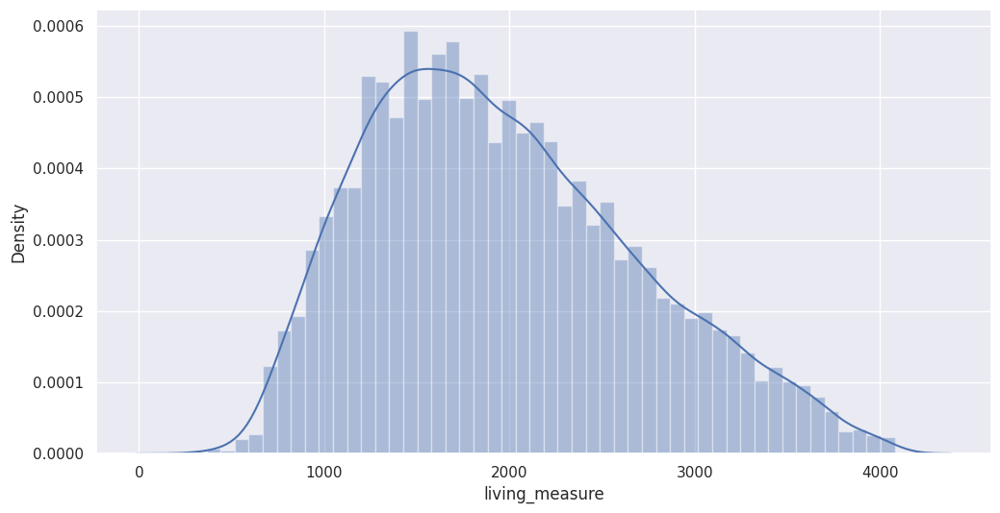

In [ ]:
plt.figure(figsize=(12, 6))
sns.distplot(DATA_NEW.living_measure)

Now let us consider the log transformation:

In [ ]:
hdf_log_trans['living_measure_log'] = np.log10(hdf_log_trans.living_measure)
hdf_log_trans.drop(['living_measure' ] ,axis=1, inplace=True)
hdf_log_trans.head(2)


,price,room_bed,room_bath,lot_measure,ceil,coast,sight,condition,quality,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day,has_basement,ceil_measure_log,living_measure_log
0,600000,4.0000,1.7500,9440.0000,1.0000,0.0000,0.0000,3.0000,8.0000,1250.0000,1966,0,98034,2020.0000,8660.0000,0.0000,12490.0000,28.3360,2015,4,27,yes,3.2553,3.4843
1,190000,2.0000,1.0000,3101.0000,1.0000,0.0000,0.0000,4.0000,6.0000,0.0000,1948,0,98118,1660.0000,4100.0000,0.0000,3771.0000,21.5079,2015,3,17,No,2.8261,2.8261


Plot a distribution plot for living measure and living measure log

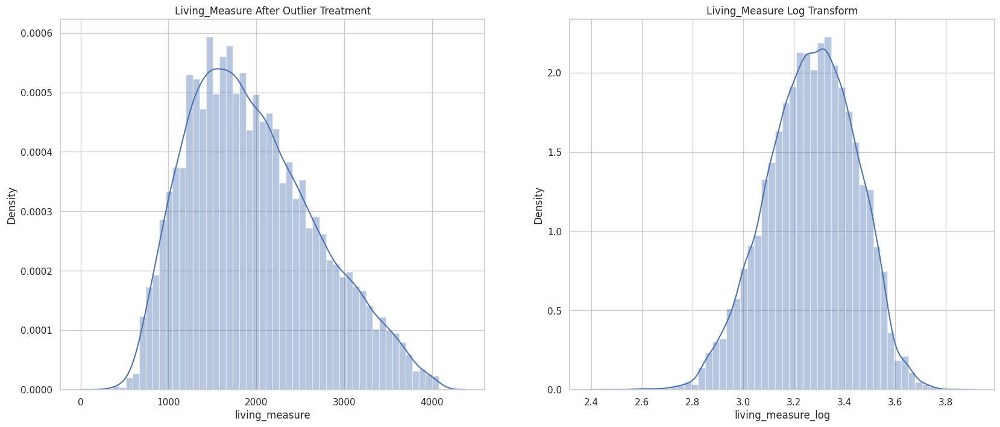

In [ ]:
plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
sns.distplot(DATA_NEW.living_measure).set(title ='Living_Measure After Outlier Treatment');
plt.subplot(1,2,2)
sns.distplot(hdf_log_trans.living_measure_log).set(title ='Living_Measure Log Transform');

In [ ]:
#Living measure skewness
print("Skewness after droping outlier is :", DATA_NEW.living_measure.skew())
print("Skewness after log transformation is :", hdf_log_trans.living_measure_log.skew())


Skewness after droping outlier is : 0.49087667221497755
Skewness after log transformation is : -0.03780532962237829


In [ ]:
DATA_NEW.shape

(20456, 24)

# Treating outliers with column-lot_measure

In [ ]:
lowerbound_lom, upperbound_lom = outlier_treatment (DATA_NEW.lot_measure)
print(lowerbound_lom,upperbound_lom)


-2875.0 18125.0


In [ ]:
DATA_NEW[(DATA_NEW.lot_measure < lowerbound_lom) | (DATA_NEW.lot_measure > upperbound_lom)]

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day,has_basement
12,480000,3.0000,2.5000,2450.0000,28185.0000,2.0000,0.0000,0.0000,3.0000,9.0000,2450.0000,0.0000,1990,0,98058,2440.0000,33541.0000,1.0000,30635.0000,9.9205,2014,10,29,No
25,250000,1.0000,1.0000,720.0000,123710.0000,1.0000,0.0000,0.0000,4.0000,6.0000,720.0000,0.0000,1935,0,98092,1860.0000,297514.0000,0.0000,124430.0000,24.2685,2014,12,30,No
28,635000,4.0000,2.5000,2470.0000,77550.0000,1.0000,0.0000,0.0000,4.0000,7.0000,2470.0000,0.0000,1987,0,98075,2490.0000,40894.0000,0.0000,80020.0000,9.9076,2014,8,29,No
37,740000,3.0000,2.5000,3000.0000,25341.0000,2.0000,0.0000,0.0000,3.0000,9.0000,3000.0000,0.0000,1995,0,98053,3000.0000,32417.0000,1.0000,28341.0000,19.1927,2014,6,10,No
87,505000,3.0000,1.5000,1830.0000,217800.0000,1.0000,0.0000,0.0000,3.0000,7.0000,1010.0000,820.0000,1981,0,98053,2450.0000,165963.0000,0.0000,219630.0000,14.3534,2014,9,4,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21581,549950,3.0000,1.7500,2930.0000,266587.0000,2.0000,0.0000,0.0000,3.0000,8.0000,2440.0000,490.0000,1995,0,98014,2700.0000,438213.0000,0.0000,269517.0000,22.4924,2014,10,19,yes
21582,255000,2.0000,1.0000,1610.0000,19965.0000,1.0000,0.0000,0.0000,3.0000,7.0000,1610.0000,0.0000,1952,0,98168,2100.0000,28400.0000,0.0000,21575.0000,23.6040,2014,8,26,No
21589,513000,3.0000,2.5000,2150.0000,161607.0000,2.0000,0.0000,0.0000,3.0000,7.0000,1330.0000,820.0000,1995,0,98038,2400.0000,207781.0000,0.0000,163757.0000,10.2998,2015,5,6,yes
21608,685530,4.0000,2.5000,3130.0000,60467.0000,2.0000,0.0000,0.0000,3.0000,9.0000,3130.0000,0.0000,1996,0,98014,2780.0000,44224.0000,1.0000,63597.0000,18.2150,2015,3,10,No


We got 2145 records which are outliers. We'll Drop these records from dataset

In [ ]:
#dropping the record from the dataset
DATA_NEW.drop (DATA_NEW[(DATA_NEW.lot_measure > upperbound_lom) | (DATA_NEW.lot_measure < lowerbound_lom) ]. index, inplace=True)


<Axes: >

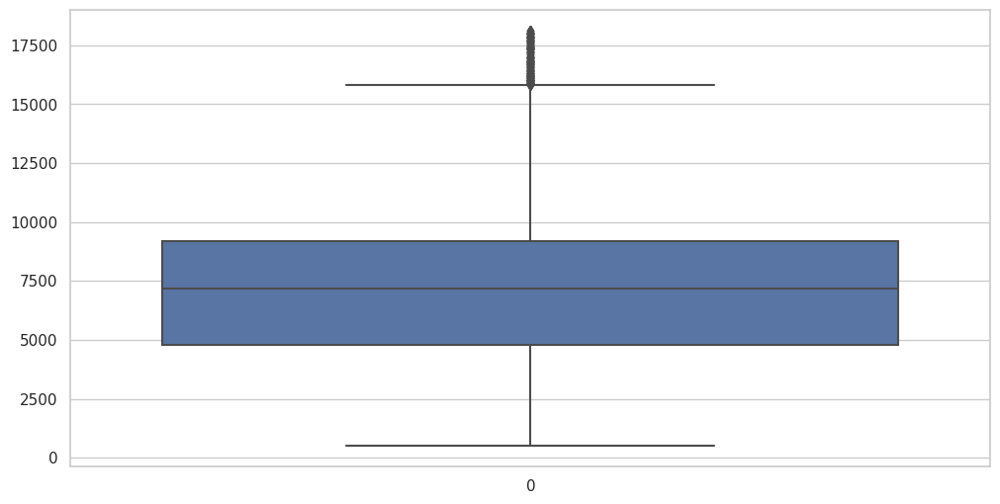

In [ ]:
#let's plot after treating outliers
plt.figure(figsize=(12, 6))
sns.boxplot(DATA_NEW['lot_measure'])

# **Log transformation**

In [ ]:
# let us consider Log transformation
hdf_log_trans['lot_measure_log'] = np.log10(hdf_log_trans.lot_measure)
hdf_log_trans.drop(['lot_measure'],axis=1,inplace=True)
hdf_log_trans.head(2)


,price,room_bed,room_bath,ceil,coast,sight,condition,quality,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day,has_basement,ceil_measure_log,living_measure_log,lot_measure_log
0,600000,4.0000,1.7500,1.0000,0.0000,0.0000,3.0000,8.0000,1250.0000,1966,0,98034,2020.0000,8660.0000,0.0000,12490.0000,28.3360,2015,4,27,yes,3.2553,3.4843,3.9750
1,190000,2.0000,1.0000,1.0000,0.0000,0.0000,4.0000,6.0000,0.0000,1948,0,98118,1660.0000,4100.0000,0.0000,3771.0000,21.5079,2015,3,17,No,2.8261,2.8261,3.4915


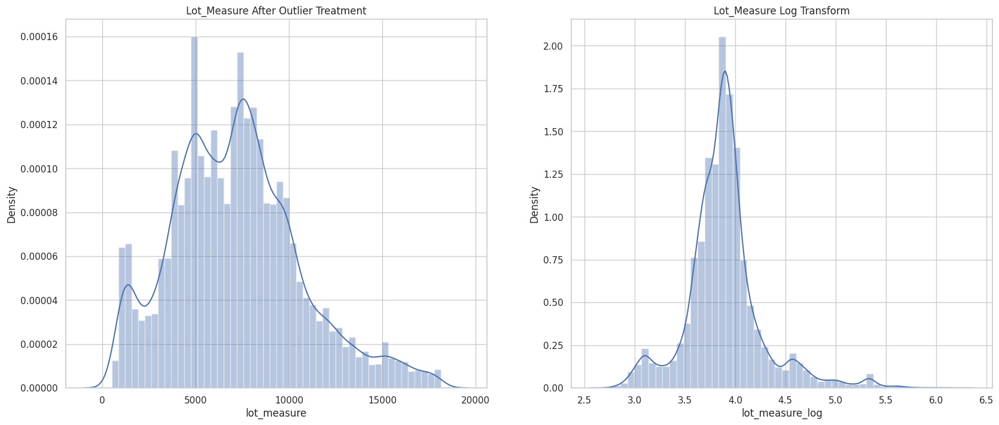

In [ ]:
plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
sns.distplot(DATA_NEW.lot_measure).set(title ='Lot_Measure After Outlier Treatment');
plt.subplot(1,2,2)
sns.distplot(hdf_log_trans.lot_measure_log).set(title ='Lot_Measure Log Transform');

In [ ]:
DATA_NEW.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day,has_basement
0,600000,4.0000,1.7500,3050.0000,9440.0000,1.0000,0.0000,0.0000,3.0000,8.0000,1800.0000,1250.0000,1966,0,98034,2020.0000,8660.0000,0.0000,12490.0000,28.3360,2015,4,27,yes
1,190000,2.0000,1.0000,670.0000,3101.0000,1.0000,0.0000,0.0000,4.0000,6.0000,670.0000,0.0000,1948,0,98118,1660.0000,4100.0000,0.0000,3771.0000,21.5079,2015,3,17,No
2,735000,4.0000,2.7500,3040.0000,2415.0000,2.0000,1.0000,4.0000,3.0000,8.0000,3040.0000,0.0000,1966,0,98118,2620.0000,2433.0000,0.0000,5455.0000,19.3974,2014,8,20,No
3,257000,3.0000,2.5000,1740.0000,3721.0000,2.0000,0.0000,0.0000,3.0000,8.0000,1740.0000,0.0000,2009,0,98002,2030.0000,3794.0000,0.0000,5461.0000,24.2813,2014,10,10,No
4,450000,2.0000,1.0000,1120.0000,4590.0000,1.0000,0.0000,0.0000,3.0000,7.0000,1120.0000,0.0000,1924,0,98118,1120.0000,5100.0000,0.0000,5710.0000,22.6901,2015,2,18,No


In [ ]:
DATA_NEW.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18311 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   price                  18311 non-null  int64  
 1   room_bed               18311 non-null  float64
 2   room_bath              18311 non-null  float64
 3   living_measure         18311 non-null  float64
 4   lot_measure            18311 non-null  float64
 5   ceil                   18311 non-null  float64
 6   coast                  18311 non-null  float64
 7   sight                  18311 non-null  float64
 8   condition              18311 non-null  float64
 9   quality                18311 non-null  float64
 10  ceil_measure           18311 non-null  float64
 11  basement               18311 non-null  float64
 12  yr_built               18311 non-null  int64  
 13  yr_renovated           18311 non-null  int64  
 14  zipcode                18311 non-null  int64  
 15  li

In [ ]:
#Dropping some more unwanted columns
#From the data analysis it is found that ‘cid’, ‘month_year’,'has_basement', ‘latitude’ and ‘longitude’ are irrelevant in predicting the target variable(Price),so we are dropping them.

df = DATA_NEW.drop('has_basement',axis=1, inplace=True)


In [ ]:
DATA_NEW.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'zipcode', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area', 'distance_to_reference',
       'year', 'month', 'day'],
      dtype='object')

# **Step 4: Data Preparation**

In [ ]:
df_new =DATA_NEW.copy()

In [ ]:
dfO = hdf_with_outlier.copy() #renaming dataframe with outliers

In [ ]:
#Final dataframes for modelling
#Dataframe shape without outliers is
df_new.shape

(18311, 23)

In [ ]:
#Dataframe with outliers is
dfO.shape

(20748, 24)

In [ ]:
#Dataframe shape with log transformation
df1 =hdf_log_trans.copy()
df1.shape

(20748, 24)

In [ ]:
df_new.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'zipcode', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area', 'distance_to_reference',
       'year', 'month', 'day'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import OneHotEncoder

s = (df_new.dtypes == 'object')
object_cols = list(s[s].index)
print("Categorical variables:")
print(object_cols)
print('No. of. categorical features: ',
      len(object_cols))

Categorical variables:
[]
No. of. categorical features:  0


In [ ]:
OH_encoder = OneHotEncoder(sparse=False)
OH_cols = pd.DataFrame(OH_encoder.fit_transform(df_new[object_cols]))
OH_cols.index = df_new.index
OH_cols.columns = OH_encoder.get_feature_names_out()
df_final = df_new.drop(object_cols, axis=1)
df_final = pd.concat([df_final, OH_cols], axis=1)

# **Step 5: Splitting the Data into Training and Testing Sets**

In [ ]:
# We divide the df into 70/30 ratio
# We specify this so that the train and test data set always have the same rows, respectively


np.random.seed(0)
df_train, df_test = train_test_split(df_new, train_size = 0.7, test_size = 0.3, random_state = 100)



In [ ]:
df_train.head()

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,living_measure15,lot_measure15,furnished,total_area,distance_to_reference,year,month,day
12686,379400,4.0000,1.7500,2120.0000,7680.0000,1.0000,0.0000,0.0000,4.0000,7.0000,1060.0000,1060.0000,1950,0,98177,1530.0000,7680.0000,0.0000,9800.0000,36.3304,2014,11,10
19135,738000,4.0000,2.5000,2830.0000,5010.0000,2.0000,0.0000,0.0000,3.0000,9.0000,2170.0000,660.0000,2000,0,98115,1880.0000,5739.0000,1.0000,7840.0000,32.7988,2014,10,29
7819,435000,2.0000,1.0000,1650.0000,5106.0000,1.0000,0.0000,0.0000,3.0000,7.0000,1090.0000,560.0000,1960,0,98115,1300.0000,6947.0000,0.0000,6756.0000,32.1010,2014,7,21
18445,261000,4.0000,1.7500,1820.0000,9824.0000,1.0000,0.0000,0.0000,5.0000,7.0000,1820.0000,0.0000,1968,0,98042,1410.0000,11013.0000,0.0000,11644.0000,14.7495,2015,1,23
1694,332500,4.0000,1.0000,1670.0000,8102.0000,1.5000,0.0000,0.0000,3.0000,6.0000,1670.0000,0.0000,1944,0,98166,1310.0000,7906.0000,0.0000,9772.0000,26.9730,2015,4,27


# **Rescaling the Features**

For Simple Linear Regression, scaling doesn't impact model. So it is extremely important to rescale the variables so that they have a comparable scale. If we don't have comparable scales, then some of the coefficients as obtained by fitting the regression model might be very large or very small as compared to the other coefficients. There are two common ways of rescaling:

*Min-Max scaling

*Standardisation (mean-0, sigma-1)

Here, we will use Standardisation Scaling.

In [ ]:
# To standardize and normalize the data in X_train and X_test, you can use the StandardScaler

from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
scaler = StandardScaler()

In [ ]:
df_new.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'zipcode', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area', 'distance_to_reference',
       'year', 'month', 'day'],
      dtype='object')

In [ ]:
sig_num_col = ['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'zipcode', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area', 'distance_to_reference',
       'year', 'month', 'day']

In [ ]:
# Apply scaler() to all the columns except the 'dummy' variables
import warnings
warnings.filterwarnings("ignore")

df_train[sig_num_col] = scaler.fit_transform(df_train[sig_num_col])

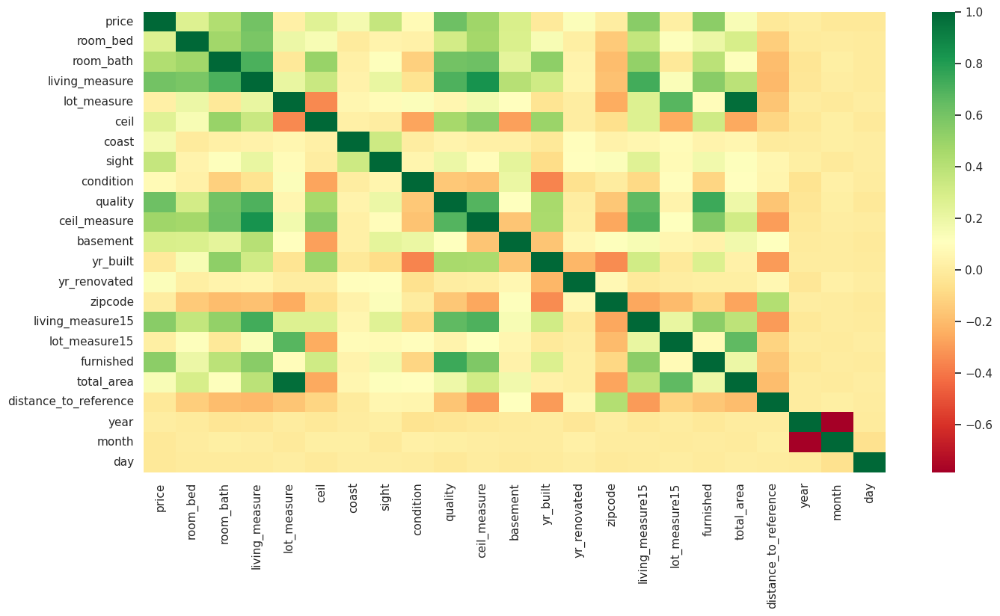

In [ ]:
# Let's check the correlation coefficients to see which variables are highly correlated

plt.figure(figsize = (16, 8))
sns.heatmap(df_train.corr(), cmap="RdYlGn")
plt.show()


In [ ]:
col = ["furnished","room_bed","room_bath","quality","ceil_measure","sight","living_measure","living_measure15"]

IndexError: ignored

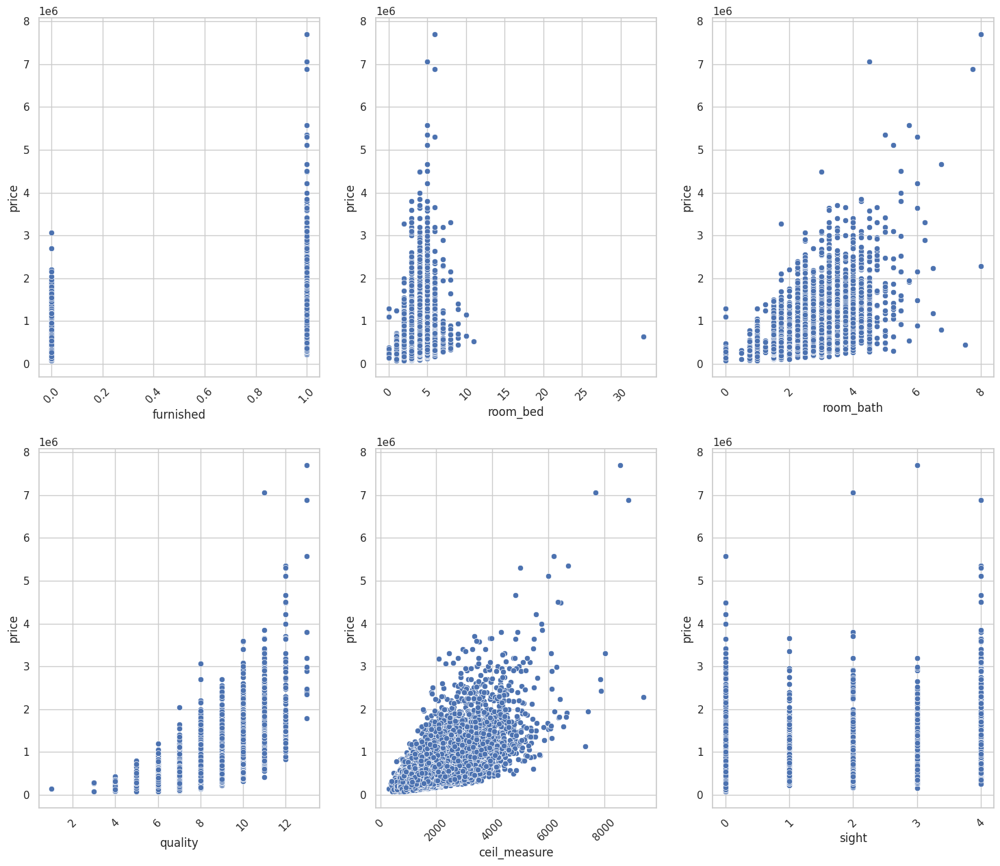

In [ ]:
# Scatter Plot of independent variables vs dependent variables

fig,axes = plt.subplots(2,3,figsize=(18,15))
for seg,col in enumerate(col):
    x,y = seg//3,seg%3
    an=sns.scatterplot(x=col, y='price' ,data=Data, ax=axes[x,y])
    plt.setp(an.get_xticklabels(), rotation=45)

plt.subplots_adjust(hspace=0.5)

In [ ]:
y_train = df_train.pop('price')
X_train = df_train

In [ ]:
X_train.head

<bound method NDFrame.head of        room_bed  room_bath  living_measure  lot_measure    ceil   coast  \
12686 0.7430    -0.3978    0.2917          0.1342       -0.8653 -0.0600   
19135 0.7430    0.6680     1.2912          -0.6412      0.9670  -0.0600   
7819  -1.4278   -1.4635    -0.3700         -0.6133      -0.8653 -0.0600   
18445 0.7430    -0.3978    -0.1306         0.7568       -0.8653 -0.0600   
1694  0.7430    -1.4635    -0.3418         0.2567       0.0509  -0.0600   
...      ...        ...        ...            ...          ...      ...   
19231 -0.3424   -0.3978    -0.8204         2.5503       -0.8653 -0.0600   
85    -1.4278   -1.4635    -1.5243         0.2802       -0.8653 -0.0600   
14311 -0.3424   -0.7530    -1.1301         0.8939       -0.8653 -0.0600   
16706 0.7430    0.6680     0.8266          1.3838       -0.8653 -0.0600   
6649  -0.3424   1.3784     1.3193          0.6264       -0.8653 -0.0600   

        sight  condition  quality  ceil_measure  basement  yr_built  

# **Step 6: Model Building**

# **1) Linear Regression**

In [ ]:
# Linear Regression fit using X_train and y_train

from sklearn.linear_model import LinearRegression

# Create a Linear Regression object
lr_model = LinearRegression()

# Fit the model on the training data
lr_model.fit(X_train, y_train)

LinearRegression()

In [ ]:
X_train_1 = X_train['room_bath']

In [ ]:
# Add a constant
X_train_1c = sm.add_constant(X_train_1)



In [ ]:
# Create a first fitted model
lr_1 = sm.OLS(y_train, X_train_1c).fit()

In [ ]:
# Check parameters created

lr_1.params

const       0.0000
room_bath   0.4238
dtype: float64

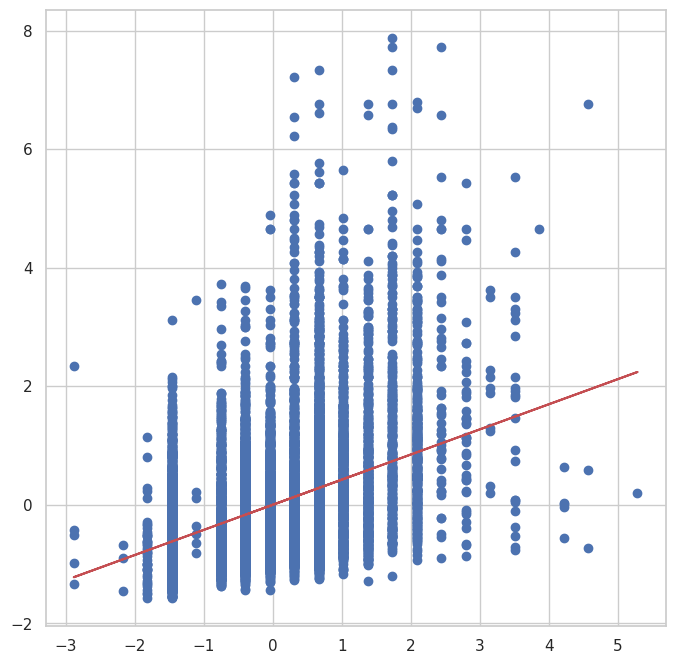

In [ ]:
# Let's visualise the data with a scatter plot and the fitted regression line

plt.scatter(X_train_1c.iloc[:, 1], y_train)
plt.plot(X_train_1c.iloc[:, 1],  0.4238*X_train_1c.iloc[:, 1], 'r')
plt.show()

In [ ]:
# Print a summary of the linear regression model obtained
print(lr_1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.180
Model:                            OLS   Adj. R-squared:                  0.180
Method:                 Least Squares   F-statistic:                     2805.
Date:                Fri, 18 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:28:43   Log-Likelihood:                -16918.
No. Observations:               12817   AIC:                         3.384e+04
Df Residuals:                   12815   BIC:                         3.385e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.164e-17      0.008   6.45e-15      1.0

Adding another variable¶ The R-squared value obtained is 0.18. Since we have so many variables, we can clearly do better than this. So let's go ahead and add the other highly correlated variable, i.e. curbweight.

In [ ]:
X_train_2 = X_train[['quality', 'living_measure','furnished']]

In [ ]:
# Add a constant
X_train_2c = sm.add_constant(X_train_2)

# Create a second fitted model
lr_2 = sm.OLS(y_train, X_train_2c).fit()

In [ ]:
print(lr_2.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.453
Model:                            OLS   Adj. R-squared:                  0.453
Method:                 Least Squares   F-statistic:                     3537.
Date:                Fri, 18 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:28:58   Log-Likelihood:                -14320.
No. Observations:               12817   AIC:                         2.865e+04
Df Residuals:                   12813   BIC:                         2.868e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const           3.993e-17      0.007   6.11e

The R-squared increased from 0.17 to 0.45

Adding another variable¶

The R-squared value obtained is 0.4. Since we have so many variables, we can clearly do better than this. So lets add another correlated variable.

In [ ]:
X_train_3 = X_train[['quality', 'ceil_measure', 'living_measure','coast', 'quality','basement' ]]

In [ ]:
# Add a constant
X_train_3c = sm.add_constant(X_train_3)

# Create a third fitted model
lr_3 = sm.OLS(y_train, X_train_3c).fit()

In [ ]:
lr_3.params

const            0.0000           
quality          -37603265286.9245
ceil_measure     3941164296.0614  
living_measure   -4249180522.1112 
coast            0.1354           
quality          37603265287.3467 
basement         2386107746.4796  
dtype: float64

In [ ]:
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     2889.
Date:                Fri, 18 Aug 2023   Prob (F-statistic):               0.00
Time:                        10:42:03   Log-Likelihood:                -14067.
No. Observations:               12817   AIC:                         2.814e+04
Df Residuals:                   12812   BIC:                         2.818e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const           3.993e-17      0.006   6.23e

In [ ]:
X_train_4 = X_train[[ 'room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil',
       'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'basement',
       'yr_built', 'yr_renovated', 'zipcode', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area', 'distance_to_reference',
       'year', 'month', 'day']]

In [ ]:
# Add a constant
X_train_4c = sm.add_constant(X_train_4)

# Create a third fitted model
lr_4 = sm.OLS(y_train, X_train_4c).fit()

In [ ]:
lr_4.params

const                   0.0000 
room_bed                -0.0517
room_bath               0.0799 
living_measure          0.1431 
lot_measure             -0.0243
ceil                    0.0693 
coast                   0.0873 
sight                   0.1041 
condition               0.0692 
quality                 0.3571 
ceil_measure            0.0882 
basement                0.1091 
yr_built                -0.3437
yr_renovated            0.0201 
zipcode                 -0.0072
living_measure15        0.1478 
lot_measure15           -0.0176
furnished               0.1213 
total_area              -0.0669
distance_to_reference   0.0306 
year                    0.0426 
month                   0.0026 
day                     -0.0148
dtype: float64

In [ ]:
print(lr_4.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.617
Model:                            OLS   Adj. R-squared:                  0.616
Method:                 Least Squares   F-statistic:                     981.6
Date:                Fri, 18 Aug 2023   Prob (F-statistic):               0.00
Time:                        10:49:47   Log-Likelihood:                -12036.
No. Observations:               12817   AIC:                         2.412e+04
Df Residuals:                   12795   BIC:                         2.428e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  5.289e-

# **RFE**

# Let's use Recursive feature elimination since we have too many independent variables

In [ ]:
# Running RFE with the output number of the variable equal to 23
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, step = 23)
rfe = rfe.fit(X_train, y_train)

In [ ]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('room_bed', False, 2),
 ('room_bath', True, 1),
 ('living_measure', True, 1),
 ('lot_measure', False, 2),
 ('ceil', False, 2),
 ('coast', True, 1),
 ('sight', True, 1),
 ('condition', True, 1),
 ('quality', True, 1),
 ('ceil_measure', True, 1),
 ('basement', True, 1),
 ('yr_built', True, 1),
 ('yr_renovated', False, 2),
 ('zipcode', False, 2),
 ('living_measure15', True, 1),
 ('lot_measure15', False, 2),
 ('furnished', True, 1),
 ('total_area', False, 2),
 ('distance_to_reference', False, 2),
 ('year', False, 2),
 ('month', False, 2),
 ('day', False, 2)]

In [ ]:
# Selecting the variables which are in support

col_sup = X_train.columns[rfe.support_]
col_sup

Index(['room_bath', 'living_measure', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'living_measure15',
       'furnished'],
      dtype='object')

In [ ]:
# Creating X_train dataframe with RFE selected variables

X_train_rfe = X_train[col_sup]

After passing the arbitary selected columns by RFE we will manually evaluate each models p-value and VIF value. Unless we find the acceptable range for p-values and VIF we keep dropping the variables one at a time based on below criteria.

*High p-value High VIF : Drop the variable

*High p-value Low VIF or Low p-value High VIF : Drop the variable with high p-value first

*Low p-value Low VIF : accept the variable

In [ ]:
# Adding a constant variable and Build a first fitted model
import statsmodels.api as sm
X_train_rfec = sm.add_constant(X_train_rfe)
lm_rfe = sm.OLS(y_train,X_train_rfec).fit()

#Summary of linear model
print(lm_rfe.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     1890.
Date:                Fri, 18 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:29:45   Log-Likelihood:                -12377.
No. Observations:               12817   AIC:                         2.478e+04
Df Residuals:                   12806   BIC:                         2.486e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.993e-17      0.006  

VIFi=1/1−Ri2

Checking VIF Variance Inflation Factor or VIF, gives a basic quantitative idea about how much the feature variables are correlated with each other. It is an extremely important parameter to test our linear model. The formula for calculating VIF is:

In [ ]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,living_measure,inf
6,ceil_measure,inf
7,basement,inf
5,quality,3.5700
0,room_bath,2.5900
9,living_measure15,2.4900
10,furnished,2.3200
8,yr_built,1.8500
3,sight,1.2800
4,condition,1.1800


We generally want a VIF that is less than 5. So there are clearly some variables we need to drop.

Dropping the variable and updating the model

Dropping quality beacuse its p-value is less and VIF is high we want p-value less than 0.05 and hence rebuilding the model

In [ ]:
# Dropping highly correlated variables and insignificant variables

X_train_rfe1 = X_train_rfe.drop('living_measure', 1,)

# Adding a constant variable and Build a second fitted model

X_train_rfe1c = sm.add_constant(X_train_rfe1)
lm_rfe1 = sm.OLS(y_train, X_train_rfe1c).fit()

#Summary of linear model
print(lm_rfe1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     1890.
Date:                Fri, 18 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:30:02   Log-Likelihood:                -12377.
No. Observations:               12817   AIC:                         2.478e+04
Df Residuals:                   12806   BIC:                         2.486e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.993e-17      0.006  

In [ ]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe1.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe1.values, i) for i in range(X_train_rfe1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,ceil_measure,3.6500
4,quality,3.5700
0,room_bath,2.5900
8,living_measure15,2.4900
9,furnished,2.3200
7,yr_built,1.8500
6,basement,1.6900
2,sight,1.2800
3,condition,1.1800
1,coast,1.1200


Now the VIFs and p-values both are within an acceptable range. So we can go ahead and make our predictions using model lm_rfe

# **Step 7: Residual Analysis of the train data**

So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of it.

In [ ]:
# Predicting the price of training set.
y_train_price = lm_rfe.predict(X_train_rfec)

Text(0.5, 0, 'Errors')

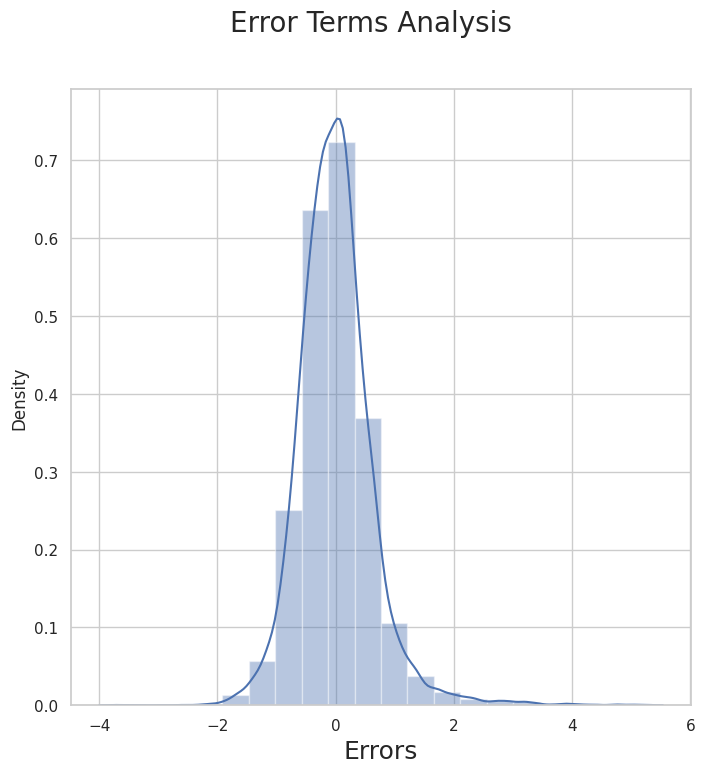

In [ ]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_price), bins = 20)
fig.suptitle('Error Terms Analysis', fontsize = 20)
plt.xlabel('Errors', fontsize = 18)

# **Step 8: Making Predictions Using the Final Model¶**

Now that we have fitted the model and checked the normality of error terms, it's time to go ahead and make predictions using the final model.

Dividing test set into X_test and y_test

In [ ]:
import warnings
warnings.filterwarnings("ignore")

df_test[sig_num_col] = scaler.transform(df_test[sig_num_col])
df_test.shape

(5494, 23)

In [ ]:
y_test = df_test.pop('price')
X_test = df_test

In [ ]:
# Adding constant
X_test_1 = sm.add_constant(X_test)

X_test_new = X_test_1[X_train_rfec.columns]

In [ ]:
# Making predictions using the final model
y_pred = lm_rfe.predict(X_test_new)

# **Step 9: Model Evaluation**

Text(0, 0.5, 'y_pred')

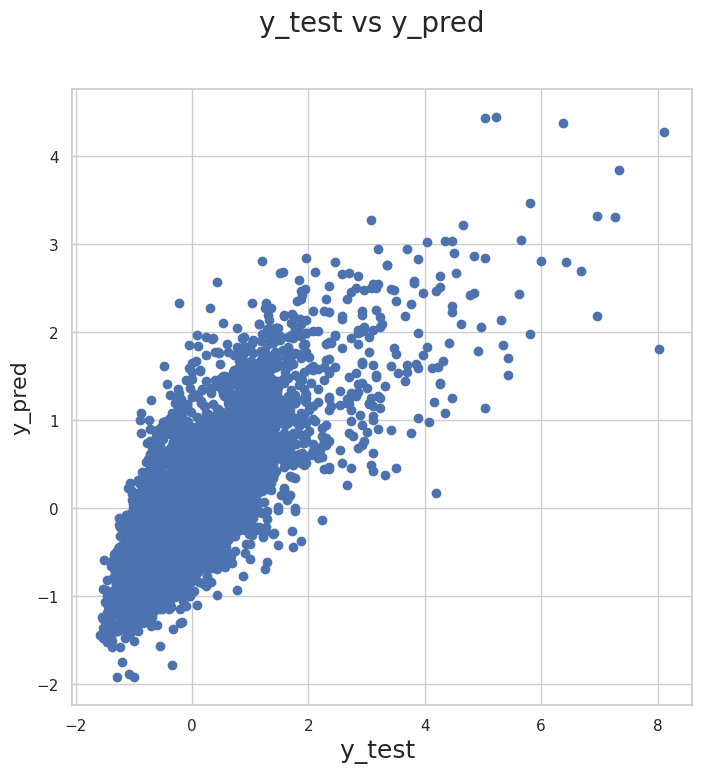

In [ ]:

#Let's now plot the graph for actual versus predicted values.

# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)
plt.xlabel('y_test ', fontsize=18)
plt.ylabel('y_pred', fontsize=16)

In [ ]:
#score of the linear model
lr_model.score(X_test,y_test)

0.617635959561657

# **RMSE Score**

In [ ]:
r2_score(y_test, y_pred)

0.5968630197846511

In [ ]:
from sklearn.metrics import mean_squared_error
import math
MSE = mean_squared_error(y_test, y_pred)

RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

Root Mean Square Error:

0.6486581619579346


# **Evaluation:**

*p-values - p-values for all the coefficients seem to be less than the significance level of 0.05. - meaning that all the predictors are statistically significant.

With lm_rfe  which has basically 11 predictor variables.

House price : 3.993 + living_measure15*(0.0969)  + coast*(0.0836) + sight*(0.1140) + quality*(0.4029) + basement*(0.1274) + yr_built*(-0.3509) + room_bath*(0.1274) + condition*(0.0430) + furnished*(0.1176)+ceil_measure*(0.1629)

# **Comparing With Different Models**

# **Decision Tree Regressor**

In [ ]:
from sklearn.tree import DecisionTreeRegressor

dt_regressor = DecisionTreeRegressor(random_state=0)
dt_regressor.fit(X_train,y_train)
y_train_pred = dt_regressor.predict(X_train)
y_test_pred = dt_regressor.predict(X_test)
dt_regressor.score(X_test,y_test)

0.5743875225769729

In [ ]:
from sklearn.metrics import mean_squared_error
import math
MSE = mean_squared_error(y_test, y_test_pred)

RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

Root Mean Square Error:

0.6664947666630978


# **Random Forest regressor**

In [ ]:
from sklearn.ensemble import RandomForestRegressor

Rf = RandomForestRegressor(n_estimators = 15,
                              random_state = 20,
                              n_jobs = -1)
Rf.fit(X_train,y_train)
Rf_train_pred = Rf.predict(X_train)
Rf_test_pred = Rf.predict(X_test)


r2_score(y_test,Rf_test_pred)

0.7819500850808961

In [ ]:
from sklearn.metrics import mean_squared_error
import math
MSE = mean_squared_error(y_test, Rf_test_pred)

RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

Root Mean Square Error:

0.47705398579117314


# **KNN Model**

In [ ]:
# Create KNN for X_train and y_train and predict y_pred for test set

from sklearn.neighbors import KNeighborsRegressor

# Create a KNN Regressor object
knn_model = KNeighborsRegressor()

# Fit the model on the training data
knn_model.fit(X_train, y_train)

# Predict the target variable for the test data
y_pred_knn = knn_model.predict(X_test)

In [ ]:
# Evaluate the KNN model by RMSE, R square, and adjusted R square

# Calculate RMSE
rmse_knn = np.sqrt(mean_squared_error(y_test, y_pred_knn))

# Calculate R-square
r2_knn = r2_score(y_test, y_pred_knn)

# Calculate adjusted R-square
n_knn = len(X_test)
p_knn = X_test.shape[1]
adj_r2_knn = 1 - (1 - r2_knn) * (n_knn - 1) / (n_knn - p_knn - 1)

print("KNN Model:")
print(f"RMSE: {rmse_knn}")
print(f"R-square: {r2_knn}")
print(f"Adjusted R-square: {adj_r2_knn}")

KNN Model:
RMSE: 0.6021603558621098
R-square: 0.6525877055712259
Adjusted R-square: 0.6511906903130587


# **BAGGING**

In [ ]:
# Create Bagging model (base model will be Decision tree) for X_train and y_train and predict y_pred for test set
from sklearn.ensemble import BaggingRegressor

# Create a Bagging Regressor object
bagging_model = BaggingRegressor()

# Fit the model on the training data
bagging_model.fit(X_train, y_train)

# Predict the target variable for the test data
y_pred_bagging = bagging_model.predict(X_test)

In [ ]:
# Evaluate the Bagging model by RMSE, R-square, and adjusted R-square

# Calculate RMSE
rmse_bagging = np.sqrt(mean_squared_error(y_test, y_pred_bagging))

# Calculate R-square
r2_bagging = r2_score(y_test, y_pred_bagging)

# Calculate adjusted R-square
n_bagging = len(X_test)
p_bagging = X_test.shape[1]
adj_r2_bagging = 1 - (1 - r2_bagging) * (n_bagging - 1) / (n_bagging - p_bagging - 1)

print("Bagging Model:")
print(f"RMSE: {rmse_bagging}")
print(f"R-square: {r2_bagging}")
print(f"Adjusted R-square: {adj_r2_bagging}")

Bagging Model:
RMSE: 0.4959099902087155
R-square: 0.7643721726675754
Adjusted R-square: 0.7634246654108923


In [ ]:
# Evaluate the Bagging model by RMSE, R-square, and adjusted R-square for train set

# Calculate RMSE
rmse_bagging_train = np.sqrt(mean_squared_error(y_train, bagging_model.predict(X_train)))

# Calculate R-square
r2_bagging_train = r2_score(y_train, bagging_model.predict(X_train))

# Calculate adjusted R-square
n_bagging_train = len(X_train)
p_bagging_train = X_train.shape[1]
adj_r2_bagging_train = 1 - (1 - r2_bagging_train) * (n_bagging_train - 1) / (n_bagging_train - p_bagging_train - 1)

print("Bagging Model (Train Set):")
print(f"RMSE: {rmse_bagging_train}")
print(f"R-square: {r2_bagging_train}")
print(f"Adjusted R-square: {adj_r2_bagging_train}")

Bagging Model (Train Set):
RMSE: 0.20282625671888238
R-square: 0.9588615095854061
Adjusted R-square: 0.9587907696456592


# **XG BOOST**

In [ ]:
# Create XG-boost model for X_train and y_train and predict y_pred for test set

from xgboost import XGBRegressor

#Create an XGBoost Regressor object
xgb_model = XGBRegressor()

#Fit the model on the training data
xgb_model.fit(X_train, y_train)

#Predict the target variable for the test data
y_pred_xgb = xgb_model.predict(X_test)

In [ ]:
# Evaluate the XGBoost model by RMSE, R-square, and adjusted R-square

# Calculate RMSE
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))

# Calculate R-square
r2_xgb = r2_score(y_test, y_pred_xgb)

# Calculate adjusted R-square
n_xgb = len(X_test)
p_xgb = X_test.shape[1]
adj_r2_xgb_train = 1 - (1 - r2_xgb) * (n_xgb - 1) / (n_xgb - p_xgb - 1)

print("XGBoost Model:")
print(f"RMSE: {rmse_xgb}")
print(f"R-square: {r2_xgb}")
print(f"Adjusted R-square: {adj_r2_xgb_train}")

XGBoost Model:
RMSE: 0.4118345793828104
R-square: 0.83749509200569
Adjusted R-square: 0.8368416268300594


# **Conclusion**:

After comparing R-Square ,Adj R-square with different tested models we found that Bagging model has highest accuracy with less RMSE score.